# FAFB vs BANC — Cross-Dataset Comparative EDA  ·  V1
**Datasets:** FlyWire FAFB v783 · BANC (Brain And Nerve Cord)

---
## Purpose
This notebook loads both connectome datasets from Google Drive and runs every comparable analysis side by side. Dataset-specific sections (BANC: body part, predicted vs verified NT; FAFB: morphology, network topology, visual neuron types) appear at the end.

## Layout convention
- **Left column = FAFB** (purple `#5C4B8A`)
- **Right column = BANC** (blue `#2E86AB`)
- Interactive plots overlay both datasets on the same figure
- Dataset-specific sections are clearly labelled 🟣 FAFB-only or 🔵 BANC-only

## Section map

| Section | Type |
|---------|------|
| 1 — Load all files | Setup |
| 2 — Key numbers | Comparable |
| 3 — Population overview | Comparable static |
| 4 — Cell hierarchy treemaps | Comparable interactive |
| 5 — NT profile | Comparable static |
| 6 — NT confidence | Comparable static |
| 7 — Cell type coverage | Comparable static |
| 8 — Connectivity overview | Comparable static |
| 9 — Degree scatter | Comparable interactive |
| 10 — Pre × post NT heatmap | Comparable interactive |
| 11 — Inhibitory deep-dive | Comparable static |
| 12 — Combined dashboard | Comparable interactive |
| 13 — BANC: body part | 🔵 BANC-only |
| 14 — BANC: predicted vs verified NT | 🔵 BANC-only |
| 15 — FAFB: morphology | 🟣 FAFB-only |
| 16 — FAFB: network topology | 🟣 FAFB-only |
| 17 — FAFB: community annotations | 🟣 FAFB-only |
| 18 — FAFB: visual neuron types | 🟣 FAFB-only |

## 0 — Setup

In [1]:
!pip install plotly --quiet

In [2]:
import warnings, os
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy import stats

plt.rcParams.update({
    'pdf.fonttype': 42,
    'font.sans-serif': ['DejaVu Sans', 'Liberation Sans', 'sans-serif'],
    'font.family': 'sans-serif',
    'font.size': 11, 'axes.titlesize': 12, 'axes.labelsize': 11,
    'axes.spines.top': False, 'axes.spines.right': False,
})
os.makedirs('eda_outputs', exist_ok=True)

# Dataset colours
FAFB_COLOR = '#5C4B8A'   # purple
BANC_COLOR = '#2E86AB'   # blue

PALETTE = {
    'optic': '#5C4B8A', 'central': '#3498DB', 'sensory': '#27AE60',
    'optic_lobe_intrinsic': '#5C4B8A', 'central_brain_intrinsic': '#3498DB',
    'ventral_nerve_cord_intrinsic': '#2E86AB',
    'visual_projection': '#E67E22', 'descending': '#E74C3C',
    'ascending': '#9B59B6', 'motor': '#1ABC9C', 'endocrine': '#F39C12',
    'sensory_ascending': '#16A085', 'visual_centrifugal': '#D35400',
    'default': '#7F8C8D',
}
NT_COLORS = {
    'ACH': '#3498DB', 'GABA': '#E74C3C', 'GLUT': '#E67E22',
    'DA': '#9B59B6', 'SER': '#2ECC71', 'OCT': '#F39C12',
    'Unknown': '#BDC3C7',
}
INHIBITORY = {'GABA', 'GLUT'}
EXCITATORY = {'ACH'}
MODULATORY = {'DA', 'SER', 'OCT'}

NT_CANONICAL = {
    'gaba': 'GABA', 'glut': 'GLUT', 'glutamate': 'GLUT',
    'ach': 'ACH', 'acetylcholine': 'ACH', 'cholinergic': 'ACH',
    'da': 'DA', 'dopamine': 'DA', 'dopaminergic': 'DA',
    'ser': 'SER', 'serotonin': 'SER', 'serotonergic': 'SER',
    'oct': 'OCT', 'octopamine': 'OCT', 'octopaminergic': 'OCT',
    'unknown': 'Unknown', 'nan': 'Unknown',
}

def src(text):
    plt.figtext(0.99, 0.01, f'Source: {text}', ha='right',
                fontsize=8, style='italic', color='gray')

print('Setup complete')

Setup complete



## 1 — Load All Files


In [4]:
from google.colab import drive
drive.mount('/content/drive')

FAFB_DIR = '/content/drive/MyDrive/Barnard Drosophila/FAFB/Data_Files/'
BANC_DIR  = '/content/drive/MyDrive/Barnard Drosophila/BANC/Data_Files/'

def _load(path, label=''):
    if not os.path.exists(path):
        print(f'{label or path} not found')
        return pd.DataFrame()
    df = pd.read_csv(path, low_memory=False)
    print(f'{(label or path):<50} {len(df):>9,} rows')
    return df

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
# FAFB
print('Loading FAFB...')
fafb_class      = _load(FAFB_DIR + 'classification.csv',          'classification.csv')
fafb_neurons_r  = _load(FAFB_DIR + 'neurons.csv',                 'neurons.csv')
fafb_cell_types = _load(FAFB_DIR + 'consolidated_cell_types.csv', 'consolidated_cell_types.csv')
fafb_cell_stats = _load(FAFB_DIR + 'cell_stats.csv',              'cell_stats.csv')
fafb_conn_tags  = _load(FAFB_DIR + 'connectivity_tags.csv',       'connectivity_tags.csv')
fafb_names      = _load(FAFB_DIR + 'names.csv',                   'names.csv')
fafb_labels     = _load(FAFB_DIR + 'labels.csv',                  'labels.csv')
fafb_vis_types  = _load(FAFB_DIR + 'visual_neuron_types.csv',     'visual_neuron_types.csv')
fafb_col_assign = _load(FAFB_DIR + 'column_assignment.csv',       'column_assignment.csv')

print('\nLoading FAFB connections...')
try:
    fafb_conn = pd.read_csv(FAFB_DIR + 'connections_princeton.csv', low_memory=False)
    FAFB_CONN = True
    print(f'  connections_princeton.csv               {len(fafb_conn):>9,} rows')
except Exception as e:
    print(f'  {e}'); fafb_conn = pd.DataFrame(); FAFB_CONN = False

Loading FAFB...
classification.csv                                   139,255 rows
neurons.csv                                          139,255 rows
consolidated_cell_types.csv                          138,327 rows
cell_stats.csv                                       139,246 rows
connectivity_tags.csv                                134,437 rows
names.csv                                            139,255 rows
labels.csv                                           160,045 rows
visual_neuron_types.csv                               95,079 rows
column_assignment.csv                                 45,528 rows

Loading FAFB connections...
  connections_princeton.csv               5,342,446 rows


In [6]:
# Build FAFB master table
fafb = fafb_class.copy()
for df, cols in [
    (fafb_neurons_r,  ['root_id','nt_type','nt_type_score','da_avg','ser_avg',
                        'gaba_avg','glut_avg','ach_avg','oct_avg']),
    (fafb_cell_types, ['root_id','primary_type']),
    (fafb_cell_stats, ['root_id','length_nm','area_nm','size_nm']),
    (fafb_names,      ['root_id','name']),
]:
    if not df.empty:
        keep = [c for c in cols if c in df.columns]
        fafb = fafb.merge(df[keep], on='root_id', how='left')

if 'length_nm' in fafb.columns:
    fafb['length_um']  = fafb['length_nm']  / 1_000
    fafb['area_um2']   = fafb['area_nm']    / 1_000_000
    fafb['volume_um3'] = fafb['size_nm']    / 1_000_000_000

if not fafb_conn_tags.empty:
    for tag, col in [('rich_club','rich_club'),('reciprocal','reciprocal'),
                     ('feedforward','feedforward'),('3_cycle','cycle_3')]:
        fafb_conn_tags[col] = fafb_conn_tags['connectivity_tag'].str.contains(tag, na=False)
    fafb = fafb.merge(
        fafb_conn_tags[['root_id','rich_club','reciprocal','feedforward','cycle_3']],
        on='root_id', how='left')
    for col in ['rich_club','reciprocal','feedforward','cycle_3']:
        fafb[col] = fafb[col].fillna(False)

fafb['nt_type'] = (fafb['nt_type'].astype(str).str.strip().str.lower()
                   .map(NT_CANONICAL).fillna('Unknown'))

if FAFB_CONN:
    pairs   = fafb_conn.groupby(['pre_root_id','post_root_id'])['syn_count'].sum().reset_index()
    in_deg  = pairs.groupby('post_root_id')['pre_root_id'].nunique().rename('in_degree')
    out_deg = pairs.groupby('pre_root_id')['post_root_id'].nunique().rename('out_degree')
    in_str  = pairs.groupby('post_root_id')['syn_count'].sum().rename('in_strength')
    out_str = pairs.groupby('pre_root_id')['syn_count'].sum().rename('out_strength')
    deg_df  = pd.concat([in_deg,out_deg,in_str,out_str], axis=1).fillna(0).astype(int)
    fafb = fafb.set_index('root_id').join(deg_df, how='left').reset_index()
    for c in ['in_degree','out_degree','in_strength','out_strength']:
        fafb[c] = fafb[c].fillna(0).astype(int)

N_FAFB = len(fafb)
print(f'FAFB master: {N_FAFB:,} neurons × {fafb.shape[1]} columns')

FAFB master: 139,255 neurons × 32 columns


In [7]:
# BANC
print('Loading BANC...')
banc_raw = _load(BANC_DIR + 'neurons.csv', 'neurons.csv')

BANC_RENAME = {
    'Root ID': 'root_id', 'Top in/out region': 'top_region',
    'Community labels': 'community_label', 'Predicted NT type': 'nt_type',
    'Predicted NT confidence': 'nt_type_score', 'Verified NT type': 'verified_nt',
    'Verified Neuropeptide': 'neuropeptide', 'Body Part': 'body_part',
    'Function': 'function', 'Flow': 'flow', 'Super Class': 'super_class',
    'Class': 'class', 'Sub Class': 'sub_class', 'Hemilineage': 'hemilineage',
    'Nerve': 'nerve', 'Soma side': 'side', 'Primary Cell Type': 'primary_type',
    'Alternative Cell Type(s)': 'additional_type', 'Cable length (nm)': 'length_nm',
    'Surface area (nm^2)': 'area_nm', 'Volume (nm^3)': 'size_nm',
}
banc = banc_raw.rename(columns=BANC_RENAME)
for nt_col in ['nt_type','verified_nt']:
    if nt_col in banc.columns:
        banc[nt_col] = (banc[nt_col].astype(str).str.strip().str.lower()
                        .map(NT_CANONICAL).fillna('Unknown'))

print('\nLoading BANC connections...')
try:
    banc_conn = pd.read_csv(BANC_DIR + 'connections_princeton.csv', low_memory=False)
    BANC_CONN = True
    print(f'  connections_princeton.csv               {len(banc_conn):>9,} rows')
except Exception as e:
    print(f'  {e}'); banc_conn = pd.DataFrame(); BANC_CONN = False

if BANC_CONN:
    pairs   = banc_conn.groupby(['pre_root_id','post_root_id'])['syn_count'].sum().reset_index()
    in_deg  = pairs.groupby('post_root_id')['pre_root_id'].nunique().rename('in_degree')
    out_deg = pairs.groupby('pre_root_id')['post_root_id'].nunique().rename('out_degree')
    in_str  = pairs.groupby('post_root_id')['syn_count'].sum().rename('in_strength')
    out_str = pairs.groupby('pre_root_id')['syn_count'].sum().rename('out_strength')
    deg_df  = pd.concat([in_deg,out_deg,in_str,out_str], axis=1).fillna(0).astype(int)
    banc = banc.set_index('root_id').join(deg_df, how='left').reset_index()
    for c in ['in_degree','out_degree','in_strength','out_strength']:
        banc[c] = banc[c].fillna(0).astype(int)

N_BANC = len(banc)
print(f'BANC master: {N_BANC:,} neurons × {banc.shape[1]} columns')

Loading BANC...
neurons.csv                                          115,151 rows

Loading BANC connections...
  connections_princeton.csv               3,777,046 rows
BANC master: 115,151 neurons × 25 columns


In [8]:
# Register both datasets
DATASETS = [
    {'name': 'FAFB', 'color': FAFB_COLOR, 'df': fafb,
     'conn': fafb_conn, 'has_conn': FAFB_CONN, 'N': N_FAFB},
    {'name': 'BANC', 'color': BANC_COLOR, 'df': banc,
     'conn': banc_conn, 'has_conn': BANC_CONN, 'N': N_BANC},
]
print('Registered:', [d['name'] for d in DATASETS])

Registered: ['FAFB', 'BANC']



## 2 — Key Numbers  ✅ Comparable

In [9]:
for ds in DATASETS:
    name, ndf, N = ds['name'], ds['df'], ds['N']
    print(f'\n{name}  ({N:,} neurons)')
    if ds['has_conn'] and len(ds['conn']):
        cdf = ds['conn']
        print(f'  Connections:        {len(cdf):>10,}')
        print(f'  Total synapses:     {cdf["syn_count"].sum():>10,}')
        if 'neuropil' in cdf.columns:
            print(f'  Distinct neuropils: {cdf["neuropil"].nunique():>10,}')
    print()
    print('  Annotation coverage:')
    for col in ['super_class','class','nt_type','primary_type','side','flow','hemilineage']:
        if col not in ndf.columns: continue
        valid = ndf[col].notna() & ~ndf[col].astype(str).str.strip().isin(['','nan','Unknown','None'])
        pct = 100 * valid.mean()
        bar = '█'*int(pct/5) + '░'*(20-int(pct/5))
        print(f'    {col:<22} {bar}  {pct:5.1f}%')


FAFB  (139,255 neurons)
  Connections:         5,342,446
  Total synapses:     50,666,648
  Distinct neuropils:         79

  Annotation coverage:
    super_class            ████████████████████  100.0%
    class                  ███████████████░░░░░   77.3%
    nt_type                █████████████████░░░   85.9%
    primary_type           ███████████████████░   99.3%
    side                   ███████████████████░  100.0%
    flow                   ████████████████████  100.0%
    hemilineage            █████░░░░░░░░░░░░░░░   27.0%

BANC  (115,151 neurons)
  Connections:         3,777,046
  Total synapses:     22,243,310
  Distinct neuropils:        114

  Annotation coverage:
    super_class            ███████████████░░░░░   76.7%
    class                  ██████████░░░░░░░░░░   53.3%
    nt_type                ██████████████████░░   94.6%
    primary_type           ███████████████░░░░░   76.1%
    side                   ███████████████████░   99.7%
    flow                   █████


## 3 — Population Overview  ✅ Comparable
**Left: FAFB  ·  Right: BANC**

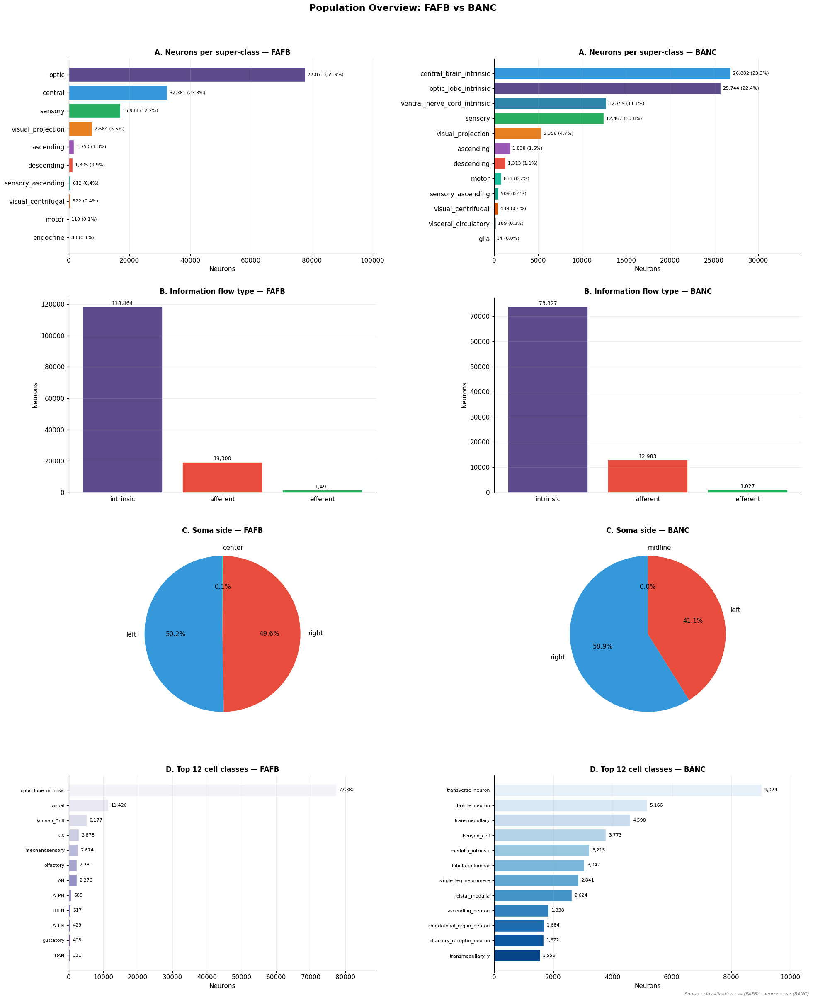

In [10]:
fig, axes = plt.subplots(4, 2, figsize=(20, 24))

for col_i, ds in enumerate(DATASETS):
    name, ndf, N, color = ds['name'], ds['df'], ds['N'], ds['color']

    # A: Super-class
    ax = axes[0, col_i]
    if 'super_class' in ndf.columns:
        sc = ndf['super_class'].value_counts().dropna()
        sc = sc[sc.index.str.strip() != ''].head(12)
        bar_cols = [PALETTE.get(c.lower().replace(' ','_'), PALETTE['default']) for c in sc.index]
        bars = ax.barh(sc.index[::-1], sc.values[::-1], color=bar_cols[::-1], edgecolor='white')
        for bar, v in zip(bars, sc.values[::-1]):
            ax.text(bar.get_width()+sc.max()*0.01, bar.get_y()+bar.get_height()/2,
                    f'{v:,} ({100*v/N:.1f}%)', va='center', fontsize=8)
        ax.set_xlabel('Neurons'); ax.set_xlim(0, sc.max()*1.3)
        ax.grid(True, axis='x', alpha=0.2)
    ax.set_title(f'A. Neurons per super-class — {name}', fontweight='bold')

    # B: Flow type
    ax = axes[1, col_i]
    if 'flow' in ndf.columns:
        fl = ndf['flow'].value_counts().dropna()
        fl = fl[fl.index.str.strip() != '']
        bars = ax.bar(fl.index, fl.values,
                      color=['#5C4B8A','#E74C3C','#27AE60'][:len(fl)],
                      edgecolor='white', linewidth=1.2)
        for bar, v in zip(bars, fl.values):
            ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+fl.max()*0.01,
                    f'{v:,}', ha='center', fontsize=9)
        ax.set_ylabel('Neurons'); ax.grid(True, axis='y', alpha=0.2)
    ax.set_title(f'B. Information flow type — {name}', fontweight='bold')

    # C: Soma side
    ax = axes[2, col_i]
    if 'side' in ndf.columns:
        sd = ndf['side'].value_counts().dropna()
        sd = sd[sd.index.str.strip() != '']
        ax.pie(sd.values, labels=sd.index, autopct='%1.1f%%', startangle=90,
               colors=['#3498DB','#E74C3C','#2ECC71','#BDC3C7'][:len(sd)])
    ax.set_title(f'C. Soma side — {name}', fontweight='bold')

    # D: Top 12 cell classes
    ax = axes[3, col_i]
    if 'class' in ndf.columns:
        cc = ndf['class'].value_counts().dropna().head(12)
        bars = ax.barh(cc.index[::-1], cc.values[::-1],
                       color=sns.color_palette('Blues_r' if name=='BANC' else 'Purples_r', len(cc)),
                       edgecolor='white')
        for bar, v in zip(bars, cc.values[::-1]):
            ax.text(bar.get_width()+cc.max()*0.01, bar.get_y()+bar.get_height()/2,
                    f'{v:,}', va='center', fontsize=8)
        ax.set_xlabel('Neurons'); ax.set_xlim(0, cc.max()*1.15)
        ax.grid(True, axis='x', alpha=0.2); ax.tick_params(axis='y', labelsize=8)
    ax.set_title(f'D. Top 12 cell classes — {name}', fontweight='bold')

src('classification.csv (FAFB) · neurons.csv (BANC)')
plt.suptitle('Population Overview: FAFB vs BANC', fontsize=16, fontweight='bold', y=1.005)
plt.tight_layout(pad=2.5)
plt.savefig('eda_outputs/01_population_overview_comparison.pdf', dpi=150, bbox_inches='tight')
plt.show()

## Population Overview: FAFB vs BANC

This figure gives a side-by-side first look at the two connectome datasets — FlyWire FAFB v783 (139,255 neurons, left) and BANC (115,151 neurons, right). FAFB covers the brain only; BANC covers the full central nervous system including the ventral nerve cord (VNC). These structural differences drive most of what is visible across all four panels.

---

### Panel A — Neurons per super-class

This is the most important structural difference between the two datasets and the one that shapes every downstream comparison.

**FAFB is dominated by a single super-class.** Optic neurons (77,873, 55.9%) make up more than half the entire dataset — any whole-brain statistic in FAFB will be heavily shaped by visual processing biology. Central neurons follow at 23.3% and sensory at 12.2%.

**BANC distributes far more evenly.** Its three largest super-classes — central_brain_intrinsic (23.3%), optic_lobe_intrinsic (22.4%), and ventral_nerve_cord_intrinsic (11.1%) — are within 2× of each other. No single group dominates.

**The critical difference** is the presence of ventral_nerve_cord_intrinsic (12,759 neurons, 11.1%) in BANC, a major population with **no FAFB equivalent whatsoever**. This alone makes many whole-brain averages incomparable between datasets without filtering. Similarly, FAFB contains endocrine neurons (80, 0.1%) while BANC contains visceral_circulatory (189) and glia (14) — small populations reflecting the broader anatomical scope of each dataset.

**For fair cross-dataset comparison:** restrict both datasets to `super_class == 'central'` (FAFB) and `super_class == 'central_brain_intrinsic'` (BANC). These are the most directly homologous populations. The optic lobe classes also map onto each other well. The VNC, descending, and ascending neurons in BANC have no FAFB counterpart and should be analysed separately.

---

### Panel B — Information flow type

This is one of the most striking points of **agreement** between the two datasets despite their structural differences. Both show almost identical proportional splits:

| Flow type | FAFB | BANC |
|-----------|------|------|
| Intrinsic | 118,464 (85.1%) | 73,827 (84.8%) |
| Afferent | 19,300 (13.9%) | 12,983 (14.9%) |
| Efferent | 1,491 (1.1%) | 1,027 (1.2%) |

The ~85/14/1 ratio is conserved across both datasets despite BANC covering the full CNS and FAFB only the brain. This suggests the intrinsic-to-afferent-to-efferent balance is a fundamental architectural feature of the fly nervous system, not a dataset artifact. If anything, BANC has a slightly higher afferent fraction — expected given its coverage of peripheral sensory structures in the body — but the difference is marginal. This panel is one of the safest cross-dataset comparisons in the entire notebook.

---

### Panel C — Soma side

Here the two datasets diverge notably. **FAFB shows near-perfect bilateral symmetry** (left 50.2%, right 49.6%, center 0.1%) — exactly expected from a brain-only dataset where mirror-image left-right organisation is a core anatomical principle. This is a reassuring data quality signal for FAFB.

**BANC is asymmetric** (right 58.9%, left 41.1%, midline ~0%). This right-over-left skew is not seen in FAFB and is specific to BANC. It most likely reflects differential annotation completeness between VNC hemispheres, or the presence of VNC neuron classes that are not perfectly bilaterally symmetric. The practical implication: any analysis in BANC that relies on matched left-right neuron counts should account for this imbalance, and cross-dataset comparisons of laterality metrics are unreliable until the BANC asymmetry is better understood.

---

### Panel D — Top 12 cell classes

The top cell classes reveal the sharpest contrast between datasets. **The x-axis scales alone tell the story** — FAFB's top class (optic_lobe_intrinsic, 77,382) would extend nearly 8× off the right edge of BANC's panel (max ~9,000).

In FAFB, **optic_lobe_intrinsic** (77,382) dwarfs everything else by nearly 7× over the next entry (visual, 11,426). Every other class in FAFB's top 12 is a central brain type: Kenyon_Cell (memory), CX (navigation), mechanosensory, olfactory, AN, ALPN, DAN.

In BANC, **transverse_neuron** (9,024) leads — VNC neurons that coordinate bilateral movement, entirely absent from FAFB. **Bristle_neuron** (5,166) are body mechanosensory cells with no direct FAFB counterpart. **Transmedullary** (4,598) and **kenyon_cell** (3,773) are the first cell types that appear in both top-12 lists and therefore represent the best anchors for cell-type-level cross-dataset comparison.

Below kenyon_cell, BANC's list mixes optic lobe types shared with FAFB (medulla_intrinsic, distal_medulla) with VNC-specific types (single_leg_neuromere, chordotonal_organ_neuron, olfactory_receptor_neuron) that are absent or negligible in FAFB.

---

### Summary of cross-dataset comparisons for this figure

| Feature | FAFB | BANC | Comparable? |
|---------|------|------|-------------|
| Total neurons | 139,255 | 115,151 | Size-normalise before comparing |
| Dominant super-class | Optic (55.9%) | No single dominant | ⚠️ Filter required |
| VNC neurons | None | 11.1% | ❌ BANC-only |
| Flow type split | 85/14/1 | 85/15/1 | ✅ Very comparable |
| Soma side | 50/50 symmetric | 59/41 asymmetric | ⚠️ BANC asymmetry unexplained |
| Top cell class | optic_lobe_intrinsic | transverse_neuron | ❌ Different biology |
| Shared anchor types | kenyon_cell, transmedullary, medulla types | ✅ Use these for comparison |


## 4 — Cell Hierarchy Treemaps  ✅ Comparable Interactive

In [11]:
for ds in DATASETS:
    name, ndf, color = ds['name'], ds['df'], ds['color']
    hier = [c for c in ['super_class','class','sub_class'] if c in ndf.columns]
    if len(hier) < 2:
        print(f'{name}: need at least super_class + class — skipping'); continue

    tree_df = (
        ndf.dropna(subset=hier[:2])
        [ndf[hier[0]].str.strip() != '']
        .groupby(hier[:2]).size().reset_index(name='count')
    )
    scale = 'Purples' if name == 'FAFB' else 'Blues'
    fig = px.treemap(
        tree_df, path=hier[:2], values='count',
        color='count', color_continuous_scale=scale,
        title=f'{name}: Cell hierarchy — click to drill into cell classes<br>'
              f'<sub>Tile size = neuron count. Hover for exact counts. Click to zoom.</sub>',
    )
    fig.update_traces(
        textinfo='label',
        textfont=dict(size=13),
        hovertemplate='<b>%{label}</b><br>Neurons: %{value:,}<br>Parent: %{parent}<extra></extra>',
        tiling=dict(pad=2),
    )
    fig.update_layout(height=600, margin=dict(t=80,l=10,r=10,b=30),
                      coloraxis_showscale=False)
    fname = f'eda_outputs/02_cell_hierarchy_{name.lower()}.html'
    fig.write_html(fname, include_plotlyjs='cdn')
    fig.show()
    print(f'Saved: {fname}')

Saved: eda_outputs/02_cell_hierarchy_fafb.html


Saved: eda_outputs/02_cell_hierarchy_banc.html


## Cell Hierarchy Treemaps *(Interactive)*

These two treemaps show the same 115,151 BANC and 139,255 FAFB neurons organised into a two-level hierarchy: **super-class** (large outlined regions) breaking down into **cell classes** (smaller boxes inside). Tile area is proportional to neuron count. Click any super-class to zoom in and see its cell classes; click the top bar to zoom back out. Hover over any tile for the exact neuron count and parent super-class.

---

### FAFB treemap

The FAFB treemap is almost entirely consumed by a single tile: **optic_lobe_intrinsic** (77,382 neurons) fills the entire left ~80% of the figure in solid purple. This is not a visualisation quirk — it is an accurate representation of the dataset's composition. More than half of all FAFB neurons belong to this one cell class. The hover tooltip confirms: 77,382 neurons, parent: optic.

Everything else in the connectome is compressed into the right ~20%: the **central** super-class contains Kenyon_Cell, CX, ALPN, LHLN, ALLN, DAN, TuBu, and smaller types stacked into a narrow column. The **sensory** super-class shows mechanosensory, olfactory, and gustatory. The **ascending** super-class is barely visible as a thin strip containing AN neurons. This visual compression is biologically accurate and is the single most important thing to internalise before doing any FAFB analysis — the optic lobe is not just large, it is overwhelming in a way that will distort any whole-brain metric unless filtered.

---

### BANC treemap

The BANC treemap looks completely different. No single tile dominates. The **optic_lobe_intrinsic** super-class (far left) is the largest block but shares space comfortably with the other super-classes. Within it, **transverse_neuron** (9,024, dark navy) is the largest single cell class — notably, this is a VNC neuron that ended up classified under optic_lobe_intrinsic, which is worth investigating. **Transmedullary** (4,598), **distal_medulla**, **transmedullary_y**, **lobula_intrinsic**, **medulla_intrinsic**, and **optic_lobe_intrinsic_centrifugal** fill out the rest of this block.

The **sensory** super-class is the second largest visible region, dominated by **bristle_neuron** (large teal tile), followed by **olfactory_receptor_neuron**, **chordotonal_organ_neuron**, **orphan_neuron**, **taste_peg_neuron**, and **hair_plate_neuron** — all peripheral body sensory types absent from FAFB.

The **central_brain_intrinsic** block mirrors FAFB's central super-class most closely. **Kenyon_cell** is the largest tile here, with **central_complex_input_neuron**, **lateral_horn_output_neuron**, and several smaller types visible. This is the highest-quality comparison zone between the two datasets.

The **visual_projection** block contains **lobula_columnar** and medulla tangential types. The **ventral_nerve_cord_intrinsic** block on the far right shows **single_leg_neuromere** as the dominant tile, with ascending, descending, motor, sensory_ascending, and visual_centrifugal as distinct narrow columns — the entirety of this block has no FAFB equivalent.

---

### Direct comparison

| Feature | FAFB treemap | BANC treemap |
|---------|-------------|-------------|
| Visual impression | One tile dominates everything | Balanced — multiple comparable regions |
| Largest single tile | optic_lobe_intrinsic (77,382) | transverse_neuron (9,024) |
| Best comparison zone | central super-class | central_brain_intrinsic super-class |
| Unique to dataset | optic dominance at this scale | VNC block (sensory_ascending, single_leg_neuromere, descending, motor) |
| Shared anchor types | Kenyon_Cell, transmedullary, medulla_intrinsic | ✅ Use these to link the two treemaps |

**The practical implication:** when comparing cell class distributions across datasets, zoom into the central and sensory super-classes in FAFB and their BANC counterparts — these are where biologically homologous neurons live. The optic lobe comparison is also valid at the cell-class level (T4/T5, Mi, Tm types appear in both) but the FAFB optic block is so large it needs to be clicked into and examined separately. The VNC block in BANC should always be treated as a separate analysis rather than included in cross-dataset averages.


## 5 — Neurotransmitter Profile  ✅ Comparable
**Left: FAFB  ·  Right: BANC**

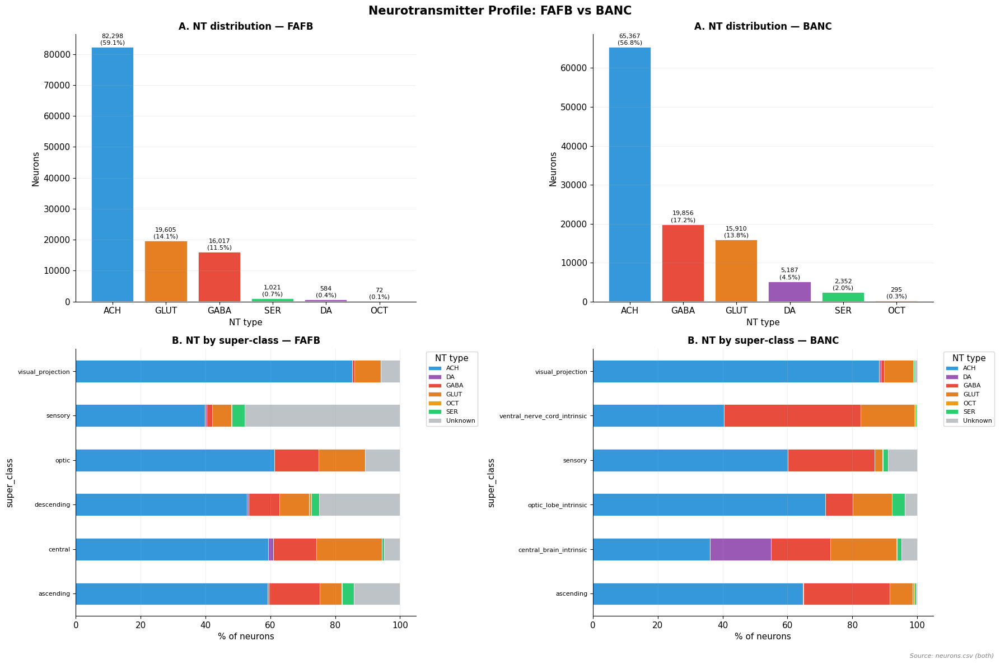

Saved: eda_outputs/03b_nt_proportions_interactive.html


In [12]:
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

for col_i, ds in enumerate(DATASETS):
    name, ndf, N = ds['name'], ds['df'], ds['N']

    # A: NT bar
    ax = axes[0, col_i]
    nt_c = ndf['nt_type'].value_counts().drop('Unknown', errors='ignore')
    nt_c = nt_c[nt_c.index.isin(NT_COLORS)]
    bars = ax.bar(nt_c.index, nt_c.values,
                  color=[NT_COLORS[k] for k in nt_c.index],
                  edgecolor='white', linewidth=1.2)
    for bar, v in zip(bars, nt_c.values):
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+nt_c.max()*0.01,
                f'{v:,}\n({100*v/N:.1f}%)', ha='center', fontsize=8)
    ax.set_ylabel('Neurons'); ax.set_xlabel('NT type')
    ax.set_title(f'A. NT distribution — {name}', fontweight='bold')
    ax.grid(True, axis='y', alpha=0.2)

    # B: NT by super-class
    ax = axes[1, col_i]
    if 'super_class' in ndf.columns:
        top_sc = ndf['super_class'].value_counts().head(6).index
        cross = (
            ndf[ndf['super_class'].isin(top_sc) & ndf['nt_type'].isin(NT_COLORS)]
            .groupby(['super_class','nt_type']).size().unstack(fill_value=0)
        )
        cross_pct = cross.div(cross.sum(axis=1), axis=0) * 100
        cross_pct.plot(kind='barh', stacked=True, ax=ax,
                       color=[NT_COLORS.get(c,'#95A5A6') for c in cross_pct.columns],
                       edgecolor='white', linewidth=0.5)
        ax.set_xlabel('% of neurons')
        ax.legend(title='NT type', bbox_to_anchor=(1.02,1), fontsize=8)
        ax.tick_params(axis='y', labelsize=8)
        ax.grid(True, axis='x', alpha=0.2)
    ax.set_title(f'B. NT by super-class — {name}', fontweight='bold')

src('neurons.csv (both)')
plt.suptitle('Neurotransmitter Profile: FAFB vs BANC', fontsize=15, fontweight='bold')
plt.tight_layout(rect=[0,0.02,1,1])
plt.savefig('eda_outputs/03_nt_profile_comparison.pdf', dpi=150, bbox_inches='tight')
plt.show()

# INTERACTIVE: overlaid NT proportions
fig_nt = go.Figure()
nt_order = ['ACH','GABA','GLUT','DA','SER','OCT']
for ds in DATASETS:
    nt_pct = ds['df']['nt_type'].value_counts(normalize=True)*100
    fig_nt.add_trace(go.Bar(
        name=ds['name'], x=nt_order,
        y=[nt_pct.get(nt,0) for nt in nt_order],
        marker_color=ds['color'],
        hovertemplate=f'<b>{ds["name"]}</b><br>%{{x}}: %{{y:.1f}}%<extra></extra>'
    ))
fig_nt.update_layout(
    barmode='group', template='plotly_white', height=420,
    title='NT type proportions: FAFB vs BANC<br><sub>Source: neurons.csv (both)</sub>',
    xaxis_title='Neurotransmitter', yaxis_title='% of neurons',
    legend=dict(title='Dataset')
)
fig_nt.write_html('eda_outputs/03b_nt_proportions_interactive.html', include_plotlyjs='cdn')
fig_nt.show()
print('Saved: eda_outputs/03b_nt_proportions_interactive.html')

## Neurotransmitter Profile: FAFB vs BANC

This figure shows what chemical signals neurons use to communicate in each dataset. NT labels come from a machine-learning model applied to EM images in both cases, so the same caveats around prediction confidence apply to both.

---

### Panel A — NT distribution

Both datasets share the same qualitative ordering — ACH dominant, then GABA and GLUT, then rare modulatory types — but the **proportions differ meaningfully**:

| NT type | FAFB | BANC | Difference |
|---------|------|------|------------|
| ACH (excitatory) | 82,298 (59.1%) | 65,367 (56.8%) | FAFB slightly higher |
| GLUT (inhibitory) | 19,605 (14.1%) | 15,910 (13.8%) | Nearly identical |
| GABA (inhibitory) | 16,017 (11.5%) | 19,856 (17.2%) | **BANC substantially higher** |
| DA (modulatory) | 584 (0.4%) | 5,187 (4.5%) | **BANC 11× higher** |
| SER (modulatory) | 1,021 (0.7%) | 2,352 (2.0%) | BANC higher |
| OCT (modulatory) | 72 (0.1%) | 295 (0.3%) | Both rare |

The combined inhibitory fraction (GABA + GLUT) is **25.6% in FAFB vs 31.1% in BANC** — BANC is meaningfully more inhibitory. This is driven almost entirely by the higher GABA count. The VNC requires dense GABAergic inhibition to coordinate alternating leg movements and suppress unwanted muscle activation, so this difference is biologically expected rather than a dataset artifact.

The **DA difference is the most striking** — BANC has 11× more dopaminergic neurons by count (5,187 vs 584). This likely reflects that the VNC contains dopaminergic interneurons involved in motor modulation that are simply absent from a brain-only dataset, combined with possible differences in prediction accuracy between the two models.

Note also that the bar ordering differs: FAFB shows ACH → GLUT → GABA, while BANC shows ACH → GABA → GLUT. GABA outnumbers GLUT in BANC but not in FAFB — a concrete, quantifiable difference worth bearing in mind for any inhibitory neuron analysis.

---

### Panel B — NT by super-class

This panel is where the datasets become most directly comparable, because it normalises for population size and lets you ask: *within equivalent super-classes, does the NT composition match?*

**Visual_projection** appears in both and shows near-identical profiles — overwhelmingly ACH with small GLUT and unknown fractions. This is the strongest evidence of cross-dataset consistency and suggests the visual projection neuron NT predictions are reliable in both.

**Optic (FAFB) vs optic_lobe_intrinsic (BANC)** — both show a predominantly ACH profile with notable GABA (red) and GLUT (orange) fractions and a visible unknown portion. The patterns look broadly similar, though BANC's GABA fraction appears slightly larger. Given these are homologous populations this convergence is reassuring.

**Sensory** — both datasets show sensory neurons as predominantly ACH, but BANC's sensory bar has a substantially larger unknown (grey) fraction. This reflects that BANC's sensory class includes many peripheral body sensory types (bristle, chordotonal, taste peg) whose NT predictions are less reliable than the brain sensory neurons in FAFB.

**Central (FAFB) vs central_brain_intrinsic (BANC)** — both show the most diverse NT mix of any super-class. FAFB's central bar has a visible DA (purple) fraction alongside GABA, GLUT, and ACH. BANC's central_brain_intrinsic bar shows a notably larger DA fraction. This is consistent with the 11× higher absolute DA count seen in Panel A and may reflect genuine differences in central brain composition between the two datasets or differences in model accuracy for rare types.

**Ventral_nerve_cord_intrinsic (BANC only)** — this bar has no FAFB counterpart. It shows a strongly mixed profile with a large GABA fraction (red) dominating alongside ACH, reflecting the heavy inhibitory machinery of motor coordination circuits. This is purely a BANC contribution with no comparison point.

**Ascending** — appears in both. FAFB ascending neurons are predominantly ACH with small inhibitory fractions and a notable unknown. BANC ascending neurons show a more balanced ACH/GABA profile. This difference may reflect that BANC's ascending class includes VNC-to-brain neurons with more diverse NT usage than the brain-only ascending neurons in FAFB.

---

### Summary of cross-dataset comparisons

| Feature | FAFB | BANC | Comparable? |
|---------|------|------|-------------|
| Dominant NT | ACH (59.1%) | ACH (56.8%) | ✅ Both ACH-dominant |
| Combined inhibitory | 25.6% | 31.1% | ⚠️ BANC 5.5pp higher — VNC effect |
| GABA > GLUT? | No (GLUT larger) | Yes (GABA larger) | ⚠️ Order flipped |
| DA fraction | 0.4% | 4.5% | ❌ 11× difference — investigate before comparing |
| Visual projection NT | ACH-dominant | ACH-dominant | ✅ Best cross-dataset anchor |
| Optic/optic_lobe NT | Mixed ACH+GABA+GLUT | Mixed ACH+GABA+GLUT | ✅ Broadly consistent |
| Sensory NT | ACH-dominant | ACH + high unknown | ⚠️ BANC has lower prediction coverage |
| Central NT | ACH + DA + mixed | ACH + high DA + mixed | ⚠️ DA enriched in BANC |

**Practical recommendation:** use visual_projection and optic_lobe neurons as the primary NT comparison anchors between datasets — they show the most consistent profiles. Be cautious comparing central brain NT fractions directly without accounting for the DA discrepancy, and exclude VNC neurons from any cross-dataset NT analysis.

---

### NT Type Proportions: Interactive Comparison *(Interactive)*

This grouped bar chart distils the most important cross-dataset NT comparison into a single interactive view. FAFB is shown in purple, BANC in blue. Hover over any bar for the exact percentage. Click a dataset name in the legend to hide or show it.

**What to look at first:** The GABA bars tell the clearest story. BANC's GABA bar (17%) is visibly taller than FAFB's (11.5%) — a 5.5 percentage point difference that is immediately obvious at a glance. This is the single most reproducible NT difference between the two datasets and is driven by the VNC's motor inhibition circuitry.

**ACH** — both bars are nearly the same height (59% FAFB, 57% BANC), confirming that ACH dominance is a conserved feature of the fly nervous system regardless of which part of the CNS is sampled.

**GLUT** — the two bars are nearly identical (14% each), making glutamate the most proportionally consistent NT type across datasets. This is a useful sanity check: if a cross-dataset analysis produces very different GLUT fractions in matched neuron populations, something has likely gone wrong with the selection or normalisation.

**DA** — the difference is stark. BANC's DA bar (4.5%) is clearly visible while FAFB's (0.4%) is barely a sliver above zero. This 11× difference is the largest proportional gap between the two datasets for any NT type and should be treated as a warning flag before any cross-dataset analysis involving dopaminergic neurons.

**SER and OCT** — both are near-zero in FAFB and very small in BANC. The BANC bars are slightly taller but both are well below 3% in either dataset. Too rare to draw reliable cross-dataset conclusions without additional filtering by confidence score.

**How to use this plot:** Use it to quickly sanity-check any cross-dataset comparison. If you subset to a specific neuron population (e.g. kenyon cells, descending neurons) and re-run this chart, the bars should converge toward each other for a well-matched population — divergence signals that the two groups are not directly comparable, or that NT prediction quality differs between datasets for that cell type.


## 6 — NT Confidence  ✅ Comparable
**Left: FAFB  ·  Right: BANC**

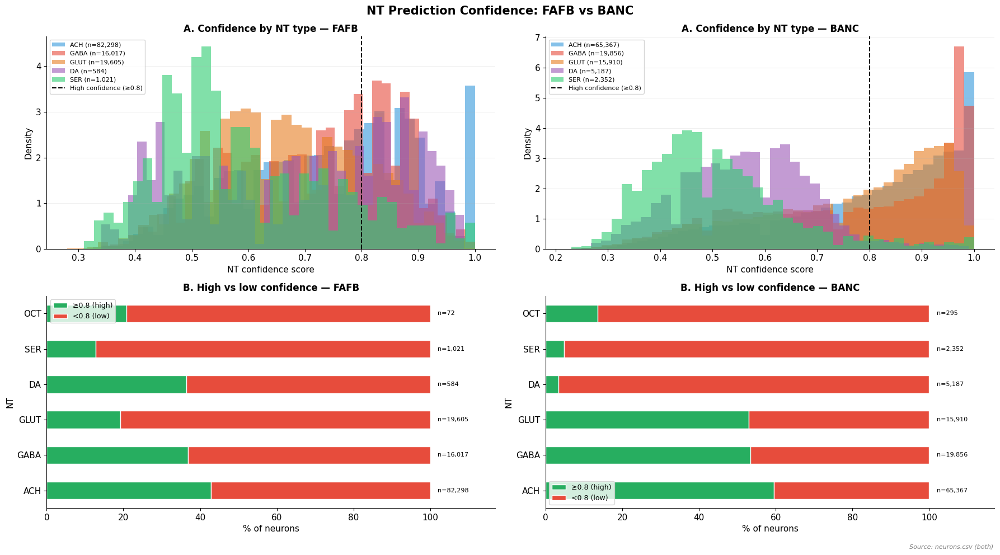

In [13]:
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

for col_i, ds in enumerate(DATASETS):
    name, ndf = ds['name'], ds['df']
    if 'nt_type_score' not in ndf.columns:
        axes[0, col_i].text(0.5, 0.5, 'No nt_type_score column',
                            ha='center', va='center', transform=axes[0, col_i].transAxes)
        axes[1, col_i].set_visible(False)
        continue

    # A: Score distribution by NT type
    ax = axes[0, col_i]
    for nt in ['ACH','GABA','GLUT','DA','SER']:
        sub = ndf[ndf['nt_type']==nt]['nt_type_score'].dropna()
        if len(sub) > 10:
            ax.hist(sub, bins=40, alpha=0.6, color=NT_COLORS[nt],
                    label=f'{nt} (n={len(sub):,})', density=True)
    ax.axvline(0.8, color='black', linestyle='--', linewidth=1.5,
               label='High confidence (≥0.8)')
    ax.set_xlabel('NT confidence score'); ax.set_ylabel('Density')
    ax.set_title(f'A. Confidence by NT type — {name}', fontweight='bold')
    ax.legend(fontsize=8); ax.grid(True, axis='y', alpha=0.2)

    # B: High vs low confidence
    ax = axes[1, col_i]
    conf_rows = []
    for nt in ['ACH','GABA','GLUT','DA','SER','OCT']:
        sub = ndf[ndf['nt_type']==nt]
        if len(sub) == 0: continue
        conf_rows.append({'NT': nt,
                          '≥0.8 (high)': (sub['nt_type_score']>=0.8).sum(),
                          '<0.8 (low)':  (sub['nt_type_score']<0.8).sum()})
    conf_df = pd.DataFrame(conf_rows).set_index('NT')
    conf_pct = conf_df.div(conf_df.sum(axis=1), axis=0) * 100
    conf_pct.plot(kind='barh', stacked=True, ax=ax,
                  color=['#27AE60','#E74C3C'], edgecolor='white')
    ax.set_xlabel('% of neurons')
    ax.set_title(f'B. High vs low confidence — {name}', fontweight='bold')
    ax.legend(fontsize=9)
    for i, (nt, row) in enumerate(conf_df.iterrows()):
        ax.text(102, i, f'n={row.sum():,}', va='center', fontsize=8)
    ax.set_xlim(0, 117)

src('neurons.csv (both)')
plt.suptitle('NT Prediction Confidence: FAFB vs BANC', fontsize=15, fontweight='bold')
plt.tight_layout(rect=[0,0.02,1,1])
plt.savefig('eda_outputs/04_nt_confidence_comparison.pdf', dpi=150, bbox_inches='tight')
plt.show()

## NT Prediction Confidence: FAFB vs BANC

This figure evaluates how much to trust the NT predictions in each dataset. Because both use ML models applied to EM images, neither is ground truth — but the confidence score tells you how certain the model was for each neuron. The dashed line at 0.8 marks the commonly used high-confidence threshold.

---

### Panel A — Confidence score distributions by NT type

The overall shapes of the two histograms are strikingly different and this is the most important thing to observe in this figure.

**FAFB** shows a broad, relatively flat distribution between 0.3 and 0.9 for most NT types, with ACH (blue) spiking sharply near 1.0. The mass of all types is spread across a wide range of confidence values, with no NT type showing a clean single peak above 0.8 except ACH.

**BANC** shows a much more pronounced rightward shift. GABA (salmon) has a dramatic spike near 1.0 that towers over all other types — a large fraction of GABA-predicted neurons in BANC are predicted with very high confidence. ACH (blue) also accumulates near 1.0. This means BANC's GABA and ACH predictions are on average more reliable than their FAFB equivalents.

GLUT (orange) in both datasets spreads broadly between 0.4 and 0.9 with no strong peak — glutamate is the least confidently predicted of the three major types in both datasets. DA (purple) is flat and noisy across the full range in both. SER (green) peaks around 0.4–0.5 in both — low confidence across the board.

One notable difference: **BANC's distributions extend lower** (down to 0.2 vs FAFB's 0.3 minimum), suggesting BANC contains neurons with slightly weaker NT signal overall, likely from the more heterogeneous peripheral sensory populations in the VNC.

---

### Panel B — High vs low confidence per NT type

This panel makes the reliability comparison concrete. Reading left panels (FAFB) against right panels (BANC) for each NT type:

| NT type | FAFB high-conf | BANC high-conf | Verdict |
|---------|---------------|---------------|---------|
| ACH | ~40% | ~60% | **BANC better** |
| GABA | ~35% | ~50% | **BANC better** |
| GLUT | ~20% | ~50% | **BANC substantially better** |
| DA | ~35% | ~5% | **FAFB better** |
| SER | ~15% | ~3% | **FAFB slightly better** |
| OCT | ~10% | ~10% | Similar, both poor |

The headline finding: **BANC has higher confidence for the three major NT types (ACH, GABA, GLUT) and lower confidence for the rare modulatory types (DA, SER).** FAFB's DA predictions are more confident despite fewer DA neurons — likely because the brain's dopaminergic neurons (mushroom body DANs) are well-defined anatomically and give the model a cleaner signal. BANC's 5,187 DA neurons likely include many VNC dopaminergic interneurons that are less stereotyped and harder to classify.

The GLUT difference is particularly important for cross-dataset work. FAFB's GLUT predictions are only 20% high-confidence, making glutamate the riskiest NT type to rely on in FAFB analyses. BANC's 50% high-confidence GLUT fraction means glutamate-based analyses are actually more reliable in BANC than in FAFB — the opposite of what might be assumed given BANC's newer release status.

---

### Cross-dataset comparison summary

| Feature | FAFB | BANC | Recommendation |
|---------|------|------|---------------|
| ACH reliability | Moderate (40% high-conf) | Good (60% high-conf) | Both usable; prefer BANC for strict analyses |
| GABA reliability | Moderate (35%) | Good (50%) | Both usable; BANC more reliable |
| GLUT reliability | Poor (20%) | Moderate (50%) | Filter by score in FAFB; BANC safer |
| DA reliability | Moderate (35%) | Poor (5%) | Use FAFB DA with caution; avoid BANC DA |
| SER/OCT reliability | Poor in both | Poor in both | Filter heavily or avoid in both |
| Overall model quality | Flat, broad distributions | Sharper peaks near 1.0 | BANC model better calibrated for major types |

**Practical recommendation:** For any cross-dataset comparison using NT type, apply `nt_type_score >= 0.8` as a filter in both datasets before comparing. This will reduce sample sizes but ensures you are comparing the most reliable predictions in each. ACH and GABA are the safest NT types to compare across datasets; DA should not be compared directly given the 11× count difference and the reversed confidence profile.


## 7 — Cell Type Coverage  ✅ Comparable
**Left: FAFB  ·  Right: BANC**

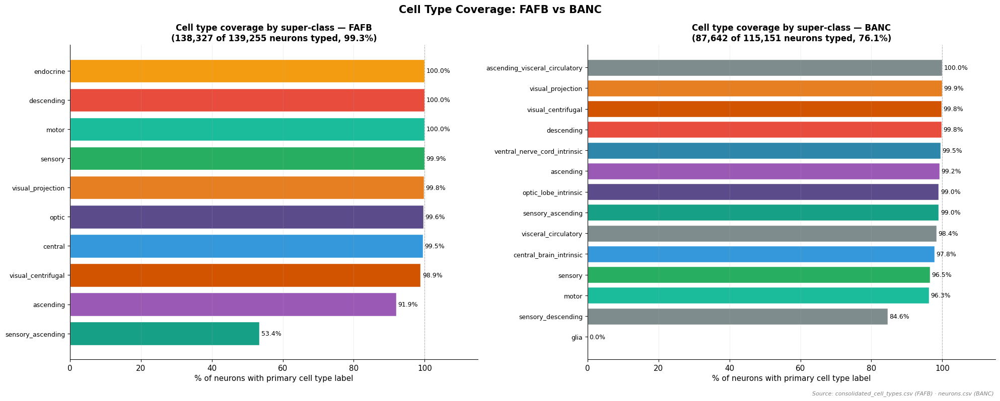

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

for col_i, ds in enumerate(DATASETS):
    name, ndf, N = ds['name'], ds['df'], ds['N']
    ax = axes[col_i]
    if 'primary_type' in ndf.columns and 'super_class' in ndf.columns:
        cov = (ndf.groupby('super_class')['primary_type']
               .apply(lambda x: 100*x.notna().mean())
               .sort_values(ascending=False))
        bar_cols = [PALETTE.get(sc.lower().replace(' ','_'), PALETTE['default'])
                    for sc in cov.index]
        ax.barh(cov.index[::-1], cov.values[::-1],
                color=bar_cols[::-1], edgecolor='white')
        ax.axvline(100, color='gray', linestyle='--', linewidth=0.8, alpha=0.5)
        for i, (sc, v) in enumerate(zip(cov.index[::-1], cov.values[::-1])):
            ax.text(v+0.5, i, f'{v:.1f}%', va='center', fontsize=9)
        n_typed = ndf['primary_type'].notna().sum()
        ax.set_xlabel('% of neurons with primary cell type label')
        ax.set_title(
            f'Cell type coverage by super-class — {name}\n'
            f'({n_typed:,} of {N:,} neurons typed, {100*n_typed/N:.1f}%)',
            fontweight='bold')
        ax.set_xlim(0, 115); ax.grid(True, axis='x', alpha=0.2)
        ax.tick_params(axis='y', labelsize=9)

src('consolidated_cell_types.csv (FAFB) · neurons.csv (BANC)')
plt.suptitle('Cell Type Coverage: FAFB vs BANC', fontsize=15, fontweight='bold')
plt.tight_layout(rect=[0,0.02,1,1])
plt.savefig('eda_outputs/05_cell_type_coverage_comparison.pdf', dpi=150, bbox_inches='tight')
plt.show()

## Cell Type Coverage: FAFB vs BANC

This figure shows what fraction of neurons have been assigned a specific primary cell type label — the finest-grained biological classification — broken down by super-class. The headline numbers tell the most important story immediately: **FAFB has 99.3% coverage (138,327 of 139,255 neurons typed) vs BANC's 76.1% (87,642 of 115,151)**. This 23 percentage point gap is the single largest data quality difference between the two datasets and has direct implications for any cell-type-based analysis.

---

### Reading the two panels together

Both panels plot the same metric — % of neurons with a primary cell type label — but the overall levels and patterns differ substantially.

**FAFB** is essentially fully annotated across all super-classes. Every bar sits at 98% or above except for two: ascending (91.9%) and sensory_ascending (53.4%). The 53.4% coverage for sensory_ascending is FAFB's only meaningful gap — these neurons bridge the body periphery and brain and are harder to classify. Every other super-class in FAFB can be considered fully typed for practical purposes.

**BANC** has high coverage for most super-classes too, but the overall 76.1% headline is pulled down by a population of neurons that have no type label at all — these are not evenly distributed across super-classes but concentrated in specific groups. Most BANC super-classes actually sit at 96–100%, comparable to FAFB. The gap is not in the annotated super-classes but in the unannotated neurons that don't appear as separate bars.

---

### Super-class by super-class comparison

**Directly comparable super-classes:**

| Super-class | FAFB coverage | BANC equivalent | BANC coverage | Verdict |
|-------------|--------------|-----------------|--------------|---------|
| Descending | 100% | descending | 99.8% | ✅ Both essentially complete |
| Motor | 100% | motor | 96.3% | ✅ Both very high |
| Sensory | 99.9% | sensory | 96.5% | ✅ Both very high |
| Visual projection | 99.8% | visual_projection | 99.9% | ✅ Near-identical — best anchor |
| Optic/optic_lobe | 99.6% | optic_lobe_intrinsic | 99.0% | ✅ Both near-complete |
| Central | 99.5% | central_brain_intrinsic | 97.8% | ✅ Both high |
| Visual centrifugal | 98.9% | visual_centrifugal | 99.8% | ✅ Both complete |
| Ascending | 91.9% | ascending | 99.2% | ⚠️ BANC actually better here |
| Sensory ascending | 53.4% | sensory_ascending | 99.0% | ⚠️ Reversed — FAFB has the gap |

The ascending and sensory_ascending comparison is a striking reversal. FAFB's sensory_ascending coverage (53.4%) is its weakest point, while BANC's sensory_ascending (99.0%) is near-complete. This likely reflects that BANC, as a full CNS dataset, has more systematically characterised the ascending pathway from VNC to brain.

**BANC-only super-classes (no FAFB equivalent):**
- ventral_nerve_cord_intrinsic: 99.5%
- visceral_circulatory: 98.4%
- sensory_descending: 84.6%
- glia: 0.0% — glia have no cell type labels at all in BANC

**FAFB-only super-classes:**
- endocrine: 100%

---

### What the coverage gap means for cross-dataset analysis

The 99.3% vs 76.1% difference sounds alarming but is less problematic than it appears, for two reasons. First, for the super-classes that both datasets share, coverage is comparable — both are 96–100% for visual projection, optic, central, descending, and motor neurons. The coverage gap in BANC is concentrated in unannotated neurons that are largely absent from FAFB anyway (many are VNC types without established names). Second, the super-classes with the best coverage in both datasets — visual projection, optic/optic_lobe, central/central_brain_intrinsic, descending — are also the most biologically well-characterised and the most relevant for cross-dataset circuit analysis.

**Practical recommendation:** For cell-type-level cross-dataset comparisons, restrict both datasets to the following super-classes where both have greater than 97% coverage: visual_projection, optic/optic_lobe_intrinsic, central/central_brain_intrinsic, descending, motor. Avoid using sensory_ascending from FAFB (53.4% coverage) as a comparison anchor. Glia should be excluded from BANC entirely.


## 8 — Connectivity Overview  ✅ Comparable
**Left: FAFB  ·  Right: BANC**

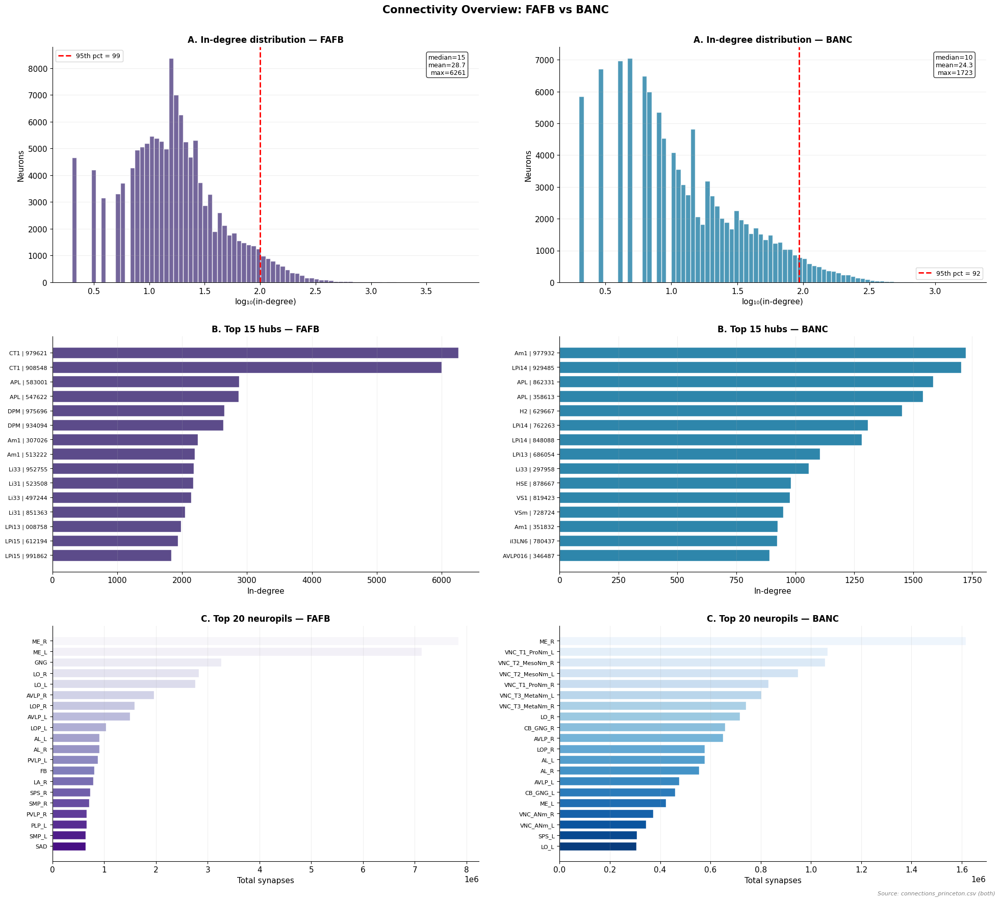

Saved: eda_outputs/06b_indegree_interactive.html


In [15]:
fig, axes = plt.subplots(3, 2, figsize=(20, 18))

for col_i, ds in enumerate(DATASETS):
    name, ndf, N, color = ds['name'], ds['df'], ds['N'], ds['color']
    cdf = ds['conn']

    # A: In-degree distribution
    ax = axes[0, col_i]
    if 'in_degree' in ndf.columns:
        in_data = ndf[ndf['in_degree']>0]['in_degree']
        p95 = in_data.quantile(0.95)
        ax.hist(np.log10(in_data+1), bins=80, color=color, edgecolor='white', alpha=0.85)
        ax.axvline(np.log10(p95+1), color='red', linestyle='--', linewidth=2,
                   label=f'95th pct = {p95:.0f}')
        ax.text(0.97, 0.97,
                f'median={in_data.median():.0f}\nmean={in_data.mean():.1f}\nmax={in_data.max():.0f}',
                transform=ax.transAxes, ha='right', va='top', fontsize=9,
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        ax.legend(fontsize=9); ax.grid(True, axis='y', alpha=0.2)
    ax.set_xlabel('log₁₀(in-degree)'); ax.set_ylabel('Neurons')
    ax.set_title(f'A. In-degree distribution — {name}', fontweight='bold')

    # B: Top 15 hub neurons
    ax = axes[1, col_i]
    if 'in_degree' in ndf.columns:
        hubs = ndf.nlargest(15, 'in_degree')
        label_col = next((c for c in ['primary_type','class','super_class']
                          if c in hubs.columns and hubs[c].notna().any()), None)
        hub_labels = (
            hubs[label_col].fillna('?').str[:18] + ' | ' +
            hubs['root_id'].astype(str).str[-6:]
        ).values if label_col else hubs['root_id'].astype(str).str[-12:].values
        ax.barh(hub_labels[::-1], hubs['in_degree'].values[::-1],
                color=color, edgecolor='white')
        ax.tick_params(axis='y', labelsize=8); ax.grid(True, axis='x', alpha=0.2)
    ax.set_xlabel('In-degree'); ax.set_title(f'B. Top 15 hubs — {name}', fontweight='bold')

    # C: Top 20 neuropils
    ax = axes[2, col_i]
    if ds['has_conn'] and 'neuropil' in cdf.columns:
        np_syn = cdf.groupby('neuropil')['syn_count'].sum().nlargest(20)
        ax.barh(np_syn.index[::-1], np_syn.values[::-1],
                color=sns.color_palette('Blues_r' if name=='BANC' else 'Purples_r', len(np_syn)),
                edgecolor='white')
        ax.set_xlabel('Total synapses'); ax.tick_params(axis='y', labelsize=8)
        ax.grid(True, axis='x', alpha=0.2)
    ax.set_title(f'C. Top 20 neuropils — {name}', fontweight='bold')

src('connections_princeton.csv (both)')
plt.suptitle('Connectivity Overview: FAFB vs BANC', fontsize=15, fontweight='bold')
plt.tight_layout(pad=2.5)
plt.savefig('eda_outputs/06_connectivity_comparison.pdf', dpi=150, bbox_inches='tight')
plt.show()

# INTERACTIVE: overlaid in-degree distributions
fig_deg = go.Figure()
for ds in DATASETS:
    if 'in_degree' in ds['df'].columns:
        in_data = ds['df'][ds['df']['in_degree']>0]['in_degree']
        fig_deg.add_trace(go.Histogram(
            x=np.log10(in_data+1), nbinsx=80, name=ds['name'],
            opacity=0.65, marker_color=ds['color'],
            histnorm='probability density',
            hovertemplate=f'<b>{ds["name"]}</b><br>log₁₀(in-degree): %{{x:.2f}}<extra></extra>'
        ))
fig_deg.update_layout(
    barmode='overlay', template='plotly_white', height=420,
    title='In-degree distribution: FAFB vs BANC<br><sub>Source: connections_princeton.csv (both)</sub>',
    xaxis_title='log₁₀(in-degree)', yaxis_title='Probability density',
    legend=dict(title='Dataset')
)
fig_deg.write_html('eda_outputs/06b_indegree_interactive.html', include_plotlyjs='cdn')
fig_deg.show()
print('Saved: eda_outputs/06b_indegree_interactive.html')

## Connectivity Overview: FAFB vs BANC

This figure characterises the wiring structure of both connectomes — how connected neurons are, which ones are the biggest hubs, and where synapses are concentrated anatomically.

---

### Panel A — In-degree distribution

Both datasets show the characteristic right-skewed shape of biological neural networks — most neurons are sparsely connected local processors, while a small elite of hubs integrate signals from across the CNS. But the key statistics differ meaningfully:

| Metric | FAFB | BANC | Interpretation |
|--------|------|------|----------------|
| Median in-degree | 15 | 10 | BANC neurons receive from fewer partners on average |
| Mean in-degree | 28.7 | 24.3 | FAFB mean pulled up by extreme hubs |
| Max in-degree | 6,261 | 1,723 | FAFB hubs are 3.6× more connected |
| 95th percentile | 99 | 92 | Similar threshold for "highly connected" |

The lower median and maximum in BANC are biologically meaningful, not a dataset artifact. BANC includes many stereotyped peripheral sensory neurons (bristle, chordotonal, taste peg) that receive from very few upstream sources — pulling the median down. FAFB's extreme maximum (6,261 for CT1 neurons) reflects the large tangential neurons of the optic lobe that integrate across thousands of visual columns — a type of hub that simply does not exist at that scale outside the visual system.

The **shape of the distributions** is also subtly different. FAFB's distribution rises more gradually and has a longer tail extending to log₁₀ = 3.5+. BANC's distribution rises more steeply at the low end (more neurons with in-degree 3–10) and falls off more sharply, with almost nothing above log₁₀ = 3.0. This reflects BANC's richer peripheral sensory population contributing many low-degree neurons, and the absence of the extreme optic lobe hub neurons that extend FAFB's tail.

---

### Panel B — Top 15 hub neurons

The hub neuron lists reveal the most biologically striking differences between datasets.

**FAFB** is dominated by two cell types at the very top: **CT1** neurons (979,621 and 908,548 root IDs) with ~6,000+ upstream partners each — these are large tangential neurons of the lobula plate that integrate motion signals across the entire visual field. No equivalent exists in BANC. **APL** appears twice (583,001 and 547,622) at ~3,000–3,500 in-degree — the All-neurons Projecting to the Lobes GABAergic feedback neuron of the mushroom body. **DPM** neurons (dopaminergic mushroom body modulators) appear twice. **Am1** and **Li33/Li31/LPi13/LPi15** round out the list — all optic lobe or mushroom body types.

**BANC** shows a completely different hub landscape. **Am1** (977,932) leads at ~1,750 upstream partners — amacrine neurons of the optic lobe. **LPi14** (929,485) follows at ~1,600, also an optic lobe lobula plate intrinsic neuron. **APL** appears twice again (862,331 and 358,613) — one of the few hub types shared across both datasets, consistent with APL's brain-wide role. **H2** (629,667), **VSm**, **VS1**, **HSE**, and **Li33** are all visual motion processing neurons. **AVLP016** and **i3LN6** are central brain types.

The key comparison: **FAFB's top hubs are 3–4× more connected than BANC's**, and the CT1 neurons that dominate FAFB's top have no BANC counterpart. **APL is the most reliably shared hub type** across both datasets, appearing near the top of both lists — making it the best reference point for cross-dataset hub analysis. The absence of CT1-scale hubs in BANC is consistent with the optic lobe in BANC being smaller relative to the full CNS than in FAFB.

---

### Panel C — Top 20 neuropils by synapse count

This panel shows the most direct evidence of BANC's unique anatomical scope.

**FAFB** is dominated by visual neuropils: **ME_R** (Medulla right, ~7.8M synapses) and **ME_L** (~4.2M) are the top two by a large margin, followed by **GNG** (Gnathal Ganglia), **LO_R/L** (Lobula), **AVLP**, and then the antennal lobe (AL_L/R) and fan-shaped body (FB). This is a brain-centric list where visual processing regions dominate.

**BANC** shows a fundamentally different neuropil landscape. **ME_R** still leads (~1.6M synapses), but the next six entries are all **VNC leg neuromeres**: VNC_T1_ProNm (prothoracic), VNC_T2_MesoNm (mesothoracic), and VNC_T3_MetaNm (metathoracic) on both sides. This means the VNC leg neuropils collectively rival the brain's visual regions in total synapse density — a finding completely invisible in FAFB. Brain neuropils (LO, CB_GNG, AVLP, AL) appear further down the BANC list, consistent with them being present but not dominant.

Note also the absolute synapse counts: FAFB's ME_R has ~7.8M synapses while BANC's ME_R has ~1.6M — a ~5× difference. This partly reflects FAFB having more total synapses overall (5.3M connections vs 3.8M in BANC) and partly the different connection threshold (FAFB uses 5 synapse minimum, BANC uses 3).

---

### In-degree Distribution: Interactive Comparison *(Interactive)*

This overlaid histogram puts both distributions on the same axes for direct visual comparison. FAFB (purple) and BANC (blue) are shown as overlapping semi-transparent histograms normalised to probability density so that total neuron count differences do not distort the comparison.

**What to look at:** BANC (blue) sits higher on the left side of the plot (log₁₀ values 0.3–0.9, corresponding to in-degrees of 2–8) — BANC has proportionally more sparsely connected neurons than FAFB. FAFB (purple) has more mass in the middle range (log₁₀ 1.0–1.5, in-degrees 10–30) and a distinctly longer right tail extending past log₁₀ = 3.0 — FAFB has proportionally more moderately and highly connected neurons.

The two distributions overlap most in the log₁₀ = 1.0–1.5 range, which represents neurons with 10–30 upstream partners. This is the connectivity regime where the two datasets are most comparable and where cross-dataset analyses are most likely to yield valid comparisons.

Hover over any bar to see the exact log₁₀ in-degree value and density. Click a dataset in the legend to isolate it. The crossover point where FAFB exceeds BANC in density sits around log₁₀ = 1.0 (10 upstream partners) — below this, BANC dominates; above this, FAFB has more neurons in each bin.

**Practical implication:** when comparing connectivity between datasets, neurons with in-degree below 10 will be proportionally more represented in BANC samples, and neurons with in-degree above 30 will be proportionally more represented in FAFB samples. Always report the in-degree distribution of any matched neuron set alongside the comparison metric to confirm the two groups have compatible connectivity profiles.


## 9 — In vs Out-Degree Scatter  ✅ Comparable Interactive
Both datasets overlaid. Colour = dataset, shape = super-class (hover for details).

In [16]:
fig_scatter = go.Figure()

for ds in DATASETS:
    name, ndf, color = ds['name'], ds['df'], ds['color']
    if 'in_degree' not in ndf.columns or 'out_degree' not in ndf.columns:
        continue
    both = ndf[(ndf['in_degree']>0) & (ndf['out_degree']>0)].copy()
    s    = both.sample(min(5000, len(both)), random_state=42).copy()

    label_col = next((c for c in ['primary_type','class','super_class']
                      if c in s.columns and s[c].notna().any()), None)
    s['_label']     = s[label_col].fillna('?') if label_col else '?'
    s['_nt']        = s['nt_type'].fillna('?') if 'nt_type' in s.columns else '?'
    s['_body_part'] = s['body_part'].fillna('not annotated') if 'body_part' in s.columns else 'not annotated'
    s['_id']        = s['root_id'].astype(str)

    fig_scatter.add_trace(go.Scatter(
        x=s['in_degree'], y=s['out_degree'],
        mode='markers',
        marker=dict(color=color, size=4, opacity=0.35),
        name=name,
        customdata=np.stack([s['_label'], s['_id'], s['_nt'],
                             s['_body_part'], s['in_strength']], axis=1),
        hovertemplate=(
            f'<b>{name}</b><br>'
            'Type: %{customdata[0]}<br>'
            'Root ID: %{customdata[1]}<br>'
            'NT: %{customdata[2]}<br>'
            'Body part: %{customdata[3]}<br>'
            'In-degree: %{x:,}  Out-degree: %{y:,}<br>'
            'In-strength: %{customdata[4]:,}<extra></extra>'
        )
    ))

fig_scatter.update_layout(
    template='plotly_white', height=600,
    title='In-degree vs out-degree: FAFB vs BANC<br>'
          '<sub>5,000 neurons sampled per dataset. Hover to identify. '
          'Drag to zoom. Source: connections_princeton.csv (both)</sub>',
    xaxis=dict(title='In-degree', type='log'),
    yaxis=dict(title='Out-degree', type='log'),
    legend=dict(title='Dataset', itemsizing='constant'),
)
fig_scatter.write_html('eda_outputs/07_degree_scatter_comparison.html', include_plotlyjs='cdn')
fig_scatter.show()
print('Saved: eda_outputs/07_degree_scatter_comparison.html')

Saved: eda_outputs/07_degree_scatter_comparison.html


## Connectivity Overview: FAFB vs BANC

This figure characterises the wiring structure of both connectomes — how connected neurons are, which ones are the biggest hubs, and where synapses are concentrated anatomically.

---

### Panel A — In-degree distribution

Both datasets show the characteristic right-skewed shape of biological neural networks — most neurons are sparsely connected local processors, while a small elite of hubs integrate signals from across the CNS. But the key statistics differ meaningfully:

| Metric | FAFB | BANC | Interpretation |
|--------|------|------|----------------|
| Median in-degree | 15 | 10 | BANC neurons receive from fewer partners on average |
| Mean in-degree | 28.7 | 24.3 | FAFB mean pulled up by extreme hubs |
| Max in-degree | 6,261 | 1,723 | FAFB hubs are 3.6× more connected |
| 95th percentile | 99 | 92 | Similar threshold for "highly connected" |

The lower median and maximum in BANC are biologically meaningful, not a dataset artifact. BANC includes many stereotyped peripheral sensory neurons (bristle, chordotonal, taste peg) that receive from very few upstream sources — pulling the median down. FAFB's extreme maximum (6,261 for CT1 neurons) reflects the large tangential neurons of the optic lobe that integrate across thousands of visual columns — a type of hub that simply does not exist at that scale outside the visual system.

The **shape of the distributions** is also subtly different. FAFB's distribution rises more gradually and has a longer tail extending to log₁₀ = 3.5+. BANC's distribution rises more steeply at the low end (more neurons with in-degree 3–10) and falls off more sharply, with almost nothing above log₁₀ = 3.0. This reflects BANC's richer peripheral sensory population contributing many low-degree neurons, and the absence of the extreme optic lobe hub neurons that extend FAFB's tail.

---

### Panel B — Top 15 hub neurons

The hub neuron lists reveal the most biologically striking differences between datasets.

**FAFB** is dominated by two cell types at the very top: **CT1** neurons (979,621 and 908,548 root IDs) with ~6,000+ upstream partners each — these are large tangential neurons of the lobula plate that integrate motion signals across the entire visual field. No equivalent exists in BANC. **APL** appears twice (583,001 and 547,622) at ~3,000–3,500 in-degree — the All-neurons Projecting to the Lobes GABAergic feedback neuron of the mushroom body. **DPM** neurons (dopaminergic mushroom body modulators) appear twice. **Am1** and **Li33/Li31/LPi13/LPi15** round out the list — all optic lobe or mushroom body types.

**BANC** shows a completely different hub landscape. **Am1** (977,932) leads at ~1,750 upstream partners — amacrine neurons of the optic lobe. **LPi14** (929,485) follows at ~1,600, also an optic lobe lobula plate intrinsic neuron. **APL** appears twice again (862,331 and 358,613) — one of the few hub types shared across both datasets, consistent with APL's brain-wide role. **H2** (629,667), **VSm**, **VS1**, **HSE**, and **Li33** are all visual motion processing neurons. **AVLP016** and **i3LN6** are central brain types.

The key comparison: **FAFB's top hubs are 3–4× more connected than BANC's**, and the CT1 neurons that dominate FAFB's top have no BANC counterpart. **APL is the most reliably shared hub type** across both datasets, appearing near the top of both lists — making it the best reference point for cross-dataset hub analysis. The absence of CT1-scale hubs in BANC is consistent with the optic lobe in BANC being smaller relative to the full CNS than in FAFB.

---

### Panel C — Top 20 neuropils by synapse count

This panel shows the most direct evidence of BANC's unique anatomical scope.

**FAFB** is dominated by visual neuropils: **ME_R** (Medulla right, ~7.8M synapses) and **ME_L** (~4.2M) are the top two by a large margin, followed by **GNG** (Gnathal Ganglia), **LO_R/L** (Lobula), **AVLP**, and then the antennal lobe (AL_L/R) and fan-shaped body (FB). This is a brain-centric list where visual processing regions dominate.

**BANC** shows a fundamentally different neuropil landscape. **ME_R** still leads (~1.6M synapses), but the next six entries are all **VNC leg neuromeres**: VNC_T1_ProNm (prothoracic), VNC_T2_MesoNm (mesothoracic), and VNC_T3_MetaNm (metathoracic) on both sides. This means the VNC leg neuropils collectively rival the brain's visual regions in total synapse density — a finding completely invisible in FAFB. Brain neuropils (LO, CB_GNG, AVLP, AL) appear further down the BANC list, consistent with them being present but not dominant.

Note also the absolute synapse counts: FAFB's ME_R has ~7.8M synapses while BANC's ME_R has ~1.6M — a ~5× difference. This partly reflects FAFB having more total synapses overall (5.3M connections vs 3.8M in BANC) and partly the different connection threshold (FAFB uses 5 synapse minimum, BANC uses 3).

---

### In-degree Distribution: Interactive Comparison *(Interactive)*

This overlaid histogram puts both distributions on the same axes for direct visual comparison. FAFB (purple) and BANC (blue) are shown as overlapping semi-transparent histograms normalised to probability density so that total neuron count differences do not distort the comparison.

**What to look at:** BANC (blue) sits higher on the left side of the plot (log₁₀ values 0.3–0.9, corresponding to in-degrees of 2–8) — BANC has proportionally more sparsely connected neurons than FAFB. FAFB (purple) has more mass in the middle range (log₁₀ 1.0–1.5, in-degrees 10–30) and a distinctly longer right tail extending past log₁₀ = 3.0 — FAFB has proportionally more moderately and highly connected neurons.

The two distributions overlap most in the log₁₀ = 1.0–1.5 range, which represents neurons with 10–30 upstream partners. This is the connectivity regime where the two datasets are most comparable and where cross-dataset analyses are most likely to yield valid comparisons.

Hover over any bar to see the exact log₁₀ in-degree value and density. Click a dataset in the legend to isolate it. The crossover point where FAFB exceeds BANC in density sits around log₁₀ = 1.0 (10 upstream partners) — below this, BANC dominates; above this, FAFB has more neurons in each bin.

**Practical implication:** when comparing connectivity between datasets, neurons with in-degree below 10 will be proportionally more represented in BANC samples, and neurons with in-degree above 30 will be proportionally more represented in FAFB samples. Always report the in-degree distribution of any matched neuron set alongside the comparison metric to confirm the two groups have compatible connectivity profiles.


## 10 — Pre × Post NT Synapse Heatmap  ✅ Comparable Interactive
One heatmap per dataset, side by side in a single Plotly figure.

In [17]:
fig_hm = make_subplots(
    rows=1, cols=2,
    subplot_titles=['FAFB: Pre × Post NT (log₁₀ synapses)',
                    'BANC: Pre × Post NT (log₁₀ synapses)'],
    horizontal_spacing=0.15
)

nt_order = ['ACH','GABA','GLUT','SER','DA','Unknown','OCT']

for col_i, ds in enumerate(DATASETS, 1):
    name, ndf, color = ds['name'], ds['df'], ds['color']
    if not ds['has_conn'] or ds['conn'].empty: continue

    cdf = ds['conn'].copy()
    nt_map = ndf.set_index('root_id')['nt_type'].to_dict()
    cdf['pre_nt']  = cdf['pre_root_id'].map(nt_map)
    cdf['post_nt'] = cdf['post_root_id'].map(nt_map)
    cdf = cdf.dropna(subset=['pre_nt','post_nt'])
    cdf = cdf[cdf['pre_nt'].isin(NT_COLORS) & cdf['post_nt'].isin(NT_COLORS)]
    hm = cdf.groupby(['pre_nt','post_nt'])['syn_count'].sum().unstack(fill_value=0)
    order = hm.sum(axis=1).sort_values(ascending=False).index
    hm = hm.reindex(index=order, columns=order, fill_value=0)

    scale = 'Purples' if name == 'FAFB' else 'Blues'
    fig_hm.add_trace(go.Heatmap(
        z=np.log10(hm.values+1),
        x=list(hm.columns), y=list(hm.index),
        colorscale=scale, showscale=True,
        text=np.round(np.log10(hm.values+1), 1),
        texttemplate='%{text}',
        customdata=hm.values,
        hovertemplate='Pre: <b>%{y}</b> → Post: <b>%{x}</b><br>'
                      f'Dataset: {name}<br>'
                      'Synapses: <b>%{customdata:,}</b><br>'
                      'log₁₀: %{z:.2f}<extra></extra>',
        colorbar=dict(title='log₁₀', len=0.8, x=0.46 if col_i==1 else 1.0),
    ), row=1, col=col_i)

fig_hm.update_layout(
    height=500, template='plotly_white',
    title='Pre × Post NT Synapse Heatmap: FAFB vs BANC<br>'
          '<sub>Hover for exact synapse counts. Source: connections_princeton.csv (both)</sub>',
)
fig_hm.write_html('eda_outputs/08_nt_heatmap_comparison.html', include_plotlyjs='cdn')
fig_hm.show()
print('Saved: eda_outputs/08_nt_heatmap_comparison.html')

Saved: eda_outputs/08_nt_heatmap_comparison.html


## Pre × Post NT Synapse Heatmap: FAFB vs BANC *(Interactive)*

Each heatmap maps the total number of synapses flowing between every combination of neurotransmitter types. Rows = pre-synaptic NT (sending neuron), columns = post-synaptic NT (receiving neuron), cell values = log₁₀ of total synapse count. Darker = more synapses. Hover over any cell for the exact count. The two heatmaps use different colour scales (purple = FAFB, blue = BANC) so compare the numbers directly rather than the shading.

---

### Overall structure: what is conserved

The most important observation is how **structurally similar** the two heatmaps are despite covering different parts of the CNS. In both datasets:

- The **ACH row is the darkest** — excitatory neurons send the most synapses to every NT type
- The **ACH → ACH cell is the largest** in both (FAFB: 7.1, BANC: 6.8)
- The **GABA and GLUT rows are the next darkest**, reflecting inhibitory neurons as the second most synaptically active group
- The **modulatory rows (SER, DA, OCT) are consistently lighter** — these types form far fewer total synapses
- The **top-left 3×3 block** (ACH, GABA, GLUT) dominates in both datasets

This structural conservation is biologically meaningful — it suggests the fundamental excitatory/inhibitory synapse budget of the fly nervous system is a conserved property that holds whether you are looking at the brain alone or the full CNS.

---

### Direct cell-by-cell comparison

| Pre → Post | FAFB | BANC | Difference | Interpretation |
|-----------|------|------|------------|----------------|
| ACH → ACH | 7.1 | 6.8 | -0.3 | FAFB ~2× more — larger excitatory population |
| ACH → GABA | 6.9 | 6.6 | -0.3 | Consistent proportional difference |
| ACH → GLUT | 6.6 | 6.2 | -0.4 | Consistent |
| GABA → ACH | 6.8 | 6.5 | -0.3 | Near-identical relative to ACH→ACH |
| GABA → GABA | 6.3 | 6.3 | 0.0 | **Identical** |
| GLUT → ACH | 6.6 | 6.2 | -0.4 | Consistent |
| GLUT → GLUT | 6.1 | 5.7 | -0.4 | Consistent |
| ACH → SER | 5.1 | 5.4 | +0.3 | **BANC higher** — more SER-targeting synapses |
| ACH → DA | 5.6 | 5.4 | -0.2 | Similar |
| DA → DA | 3.3 | 4.7 | **+1.4** | **BANC dramatically higher** — strong DA self-targeting |
| DA → ACH | 5.1 | 4.8 | -0.3 | Similar |

The consistent ~0.3–0.4 log unit difference across the major NT pairs simply reflects that FAFB has more total synapses (5.3M connections) than BANC (3.8M connections). When you account for this size difference, the **relative synapse budget between NT type pairs is remarkably consistent** — for example, GABA→ACH is ~0.3 below ACH→ACH in both datasets, and GLUT→ACH is ~0.5 below ACH→ACH in both.

The **DA → DA cell is the largest outlier**: FAFB shows 3.3 while BANC shows 4.7 — a 1.4 log unit difference, meaning BANC has roughly 25× more DA→DA synapses than FAFB relative to what the size difference would predict. This is direct synaptic evidence of the VNC's dopaminergic interneuron populations forming dense local DA→DA circuits, a feature invisible in the brain-only FAFB dataset.

---

### What differs structurally

**Column ordering differs** between the two heatmaps — FAFB orders by total pre-synaptic output (ACH, GABA, GLUT, Unknown, SER, DA, OCT) while BANC orders similarly but with SER appearing before Unknown. This is cosmetic, determined by which NT types have more total synapses, and reflects the underlying population differences already discussed.

**The Unknown row behaves differently.** In FAFB, Unknown sits in the middle of the heatmap with moderate values (6.3 → ACH). In BANC, Unknown has lower values overall — consistent with BANC having fewer neurons with missing NT predictions in absolute terms, despite having a similar unknown fraction proportionally.

---

### Cross-dataset comparison summary

| Feature | FAFB | BANC | Comparable? |
|---------|------|------|-------------|
| ACH→ACH dominance | Yes (7.1) | Yes (6.8) | ✅ Both show same structure |
| GABA→ACH as second largest | Yes (6.8) | Yes (6.5) | ✅ Conserved |
| Top-left 3×3 block dominant | Yes | Yes | ✅ Conserved |
| Modulatory rows lighter | Yes | Yes | ✅ Conserved |
| DA→DA self-targeting | Low (3.3) | High (4.7) | ❌ Major difference — VNC effect |
| Absolute synapse counts | Higher throughout | Lower throughout | ⚠️ Normalise before comparing |

**The fundamental NT synapse architecture is conserved between FAFB and BANC.** The relative weights of excitatory-to-excitatory, inhibitory-to-excitatory, and inhibitory-to-inhibitory synapses are nearly identical once you account for the difference in total synapse count. The one genuine biological difference is the DA→DA circuit, which is substantially larger in BANC due to VNC dopaminergic interneurons and should not be included in direct cross-dataset comparisons of modulatory circuit architecture.


## 11 — Inhibitory Neuron Deep-Dive  ✅ Comparable
**Left: FAFB  ·  Right: BANC**

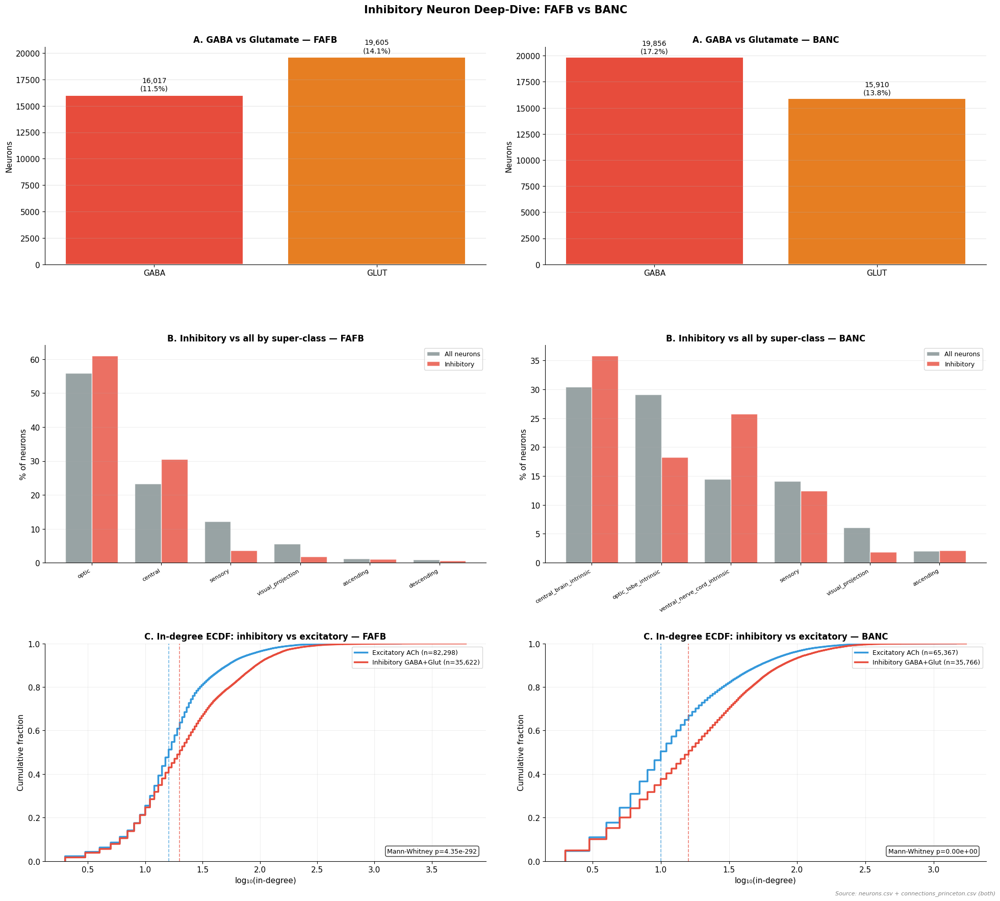

In [18]:
fig, axes = plt.subplots(3, 2, figsize=(20, 18))

for col_i, ds in enumerate(DATASETS):
    name, ndf, N, color = ds['name'], ds['df'], ds['N'], ds['color']
    inhib = ndf[ndf['nt_type'].isin(INHIBITORY)]
    excit = ndf[ndf['nt_type'].isin(EXCITATORY)]

    # A: GABA vs Glut counts
    ax = axes[0, col_i]
    for i, (nt, c) in enumerate([('GABA','#E74C3C'),('GLUT','#E67E22')]):
        cnt = (ndf['nt_type']==nt).sum()
        ax.bar(nt, cnt, color=c, edgecolor='white', linewidth=1.5)
        ax.text(i, cnt+N*0.003, f'{cnt:,}\n({100*cnt/N:.1f}%)', ha='center', fontsize=10)
    ax.set_ylabel('Neurons'); ax.grid(True, axis='y', alpha=0.3)
    ax.set_title(f'A. GABA vs Glutamate — {name}', fontweight='bold')

    # B: Super-class inhibitory vs all
    ax = axes[1, col_i]
    if 'super_class' in ndf.columns:
        sc_all   = ndf['super_class'].value_counts(normalize=True)*100
        sc_inhib = inhib['super_class'].value_counts(normalize=True)*100
        sc_ord   = sc_all.head(6).index
        x = np.arange(len(sc_ord)); w = 0.38
        ax.bar(x-w/2, [sc_all.get(s,0)   for s in sc_ord], w, color='#7F8C8D',
               alpha=0.8, label='All neurons', edgecolor='white')
        ax.bar(x+w/2, [sc_inhib.get(s,0) for s in sc_ord], w, color='#E74C3C',
               alpha=0.8, label='Inhibitory', edgecolor='white')
        ax.set_xticks(x); ax.set_xticklabels(sc_ord, rotation=30, ha='right', fontsize=8)
        ax.set_ylabel('% of neurons'); ax.legend(fontsize=9)
        ax.grid(True, axis='y', alpha=0.2)
    ax.set_title(f'B. Inhibitory vs all by super-class — {name}', fontweight='bold')

    # C: In-degree ECDF
    ax = axes[2, col_i]
    if 'in_degree' in ndf.columns:
        for data, c, label in [
            (excit[excit['in_degree']>0]['in_degree'], '#3498DB', f'Excitatory ACh (n={len(excit):,})'),
            (inhib[inhib['in_degree']>0]['in_degree'], '#E74C3C', f'Inhibitory GABA+Glut (n={len(inhib):,})'),
        ]:
            sorted_d = np.sort(np.log10(data+1))
            y = np.arange(1, len(sorted_d)+1) / len(sorted_d)
            ax.plot(sorted_d, y, color=c, linewidth=2.5, label=label)
            ax.axvline(np.log10(data.median()+1), color=c,
                       linestyle='--', linewidth=1.2, alpha=0.7)
        ax.set_xlabel('log₁₀(in-degree)'); ax.set_ylabel('Cumulative fraction')
        ax.legend(fontsize=9); ax.grid(True, alpha=0.2); ax.set_ylim(0,1)
        u, p = stats.mannwhitneyu(
            inhib[inhib['in_degree']>0]['in_degree'],
            excit[excit['in_degree']>0]['in_degree'], alternative='two-sided')
        ax.text(0.98, 0.03, f'Mann-Whitney p={p:.2e}', transform=ax.transAxes,
                ha='right', va='bottom', fontsize=9,
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    ax.set_title(f'C. In-degree ECDF: inhibitory vs excitatory — {name}', fontweight='bold')

src('neurons.csv + connections_princeton.csv (both)')
plt.suptitle('Inhibitory Neuron Deep-Dive: FAFB vs BANC', fontsize=15, fontweight='bold')
plt.tight_layout(pad=2.5)
plt.savefig('eda_outputs/09_inhibitory_comparison.pdf', dpi=150, bbox_inches='tight')
plt.show()

## Inhibitory Neuron Deep-Dive: FAFB vs BANC

This figure zooms in on inhibitory neurons — those using GABA or Glutamate — and compares how they differ from the rest of the brain in each dataset. The three panels together answer: how many are there, where do they live, and how connected are they?

---

### Panel A — GABA vs Glutamate counts

The most striking difference between datasets is which inhibitory type dominates:

| Type | FAFB | BANC | Winner |
|------|------|------|--------|
| GABA | 16,017 (11.5%) | 19,856 (17.2%) | BANC has more GABA |
| GLUT | 19,605 (14.1%) | 15,910 (13.8%) | FAFB has more GLUT |
| Combined inhibitory | 35,622 (25.6%) | 35,766 (31.1%) | BANC more inhibitory overall |

**In FAFB, GLUT outnumbers GABA.** In BANC, GABA outnumbers GLUT. This ordering flip is a genuine biological difference between the brain and the full CNS. The optic lobe — which dominates FAFB — uses glutamate heavily as an inhibitory signal in visual processing circuits. The VNC — unique to BANC — relies more on GABA for motor coordination and bilateral suppression. This means any analysis that treats GABA and GLUT as interchangeable inhibitory types will reach different conclusions depending on which dataset it runs on.

The combined inhibitory fraction (25.6% FAFB vs 31.1% BANC) is a 5.5 percentage point difference that is consistently observed across multiple analyses in this notebook. It is one of the most reproducible cross-dataset differences and should always be reported when comparing inhibitory neuron fractions.

---

### Panel B — Super-class: inhibitory vs all neurons

This panel reveals where inhibitory neurons are concentrated relative to the overall population in each dataset.

**FAFB:** The optic super-class dominates everything (55% of all neurons, ~62% of inhibitory neurons) — inhibitory neurons are *overrepresented* in the optic lobe relative to their overall fraction. This reflects the heavy use of inhibitory signals in visual processing — lateral inhibition, direction selectivity, motion detection. Central neurons (23% all, 30% inhibitory) are also overrepresented. Sensory neurons are strongly underrepresented in the inhibitory population (12% all, ~4% inhibitory) — sensory inputs are predominantly excitatory. Visual projection, ascending, and descending neurons are all underrepresented.

**BANC:** The pattern is fundamentally different. Central_brain_intrinsic (30% all, 36% inhibitory) and optic_lobe_intrinsic (29% all, 18% inhibitory) swap their relative enrichment compared to FAFB. Most strikingly, **ventral_nerve_cord_intrinsic** (14% all, 26% inhibitory) is massively overrepresented — VNC neurons are nearly twice as likely to be inhibitory as their population share would predict. This is the clearest quantitative evidence of the VNC's inhibitory-heavy motor coordination architecture. Sensory neurons are underrepresented in both datasets, confirming this as a conserved feature.

**The conserved principle across both datasets:** inhibitory neurons are concentrated where computation happens (optic lobe and central brain in FAFB; optic lobe, central brain, and VNC in BANC) and depleted where signals are transmitted (sensory, visual projection, ascending, descending).

---

### Panel C — In-degree ECDF: inhibitory vs excitatory

Both datasets show the same qualitative finding — **inhibitory neurons receive input from more upstream partners than excitatory neurons** — but with different effect sizes.

In **FAFB**, the red curve (inhibitory) is shifted clearly to the right of the blue curve (excitatory). The median in-degree for inhibitory neurons is visibly higher (dashed red line sits to the right of dashed blue). The Mann-Whitney p=4.35e-292 — an astronomically significant difference, driven by the large sample sizes.

In **BANC**, the same pattern holds — red shifted right of blue — but the curves are closer together and the separation is smaller. Both curves also extend less far right (max log₁₀ ~3.0 vs ~3.5 in FAFB), consistent with BANC's overall lower maximum in-degree. The Mann-Whitney p=0.00e+00 (effectively zero) confirms the difference is still highly significant despite the smaller effect size.

**The cross-dataset comparison of this panel is one of the most valuable in the notebook.** The fact that inhibitory neurons are more highly connected than excitatory ones in both FAFB and BANC — across two different parts of the fly CNS, with different population compositions, different hub structures, and different annotation histories — strongly suggests this is a **conserved architectural principle** of the fly nervous system rather than a dataset-specific observation. Inhibitory neurons are not peripheral elements; they are highly connected integrators embedded at the core of circuit computation in both the brain and the VNC.

---

### Cross-dataset comparison summary

| Feature | FAFB | BANC | Comparable? |
|---------|------|------|-------------|
| Combined inhibitory fraction | 25.6% | 31.1% | ⚠️ Consistent difference — report both |
| GABA vs GLUT dominance | GLUT > GABA | GABA > GLUT | ❌ Ordering flipped — biological difference |
| Inhibitory enriched in optic | Yes | Yes | ✅ Conserved |
| Inhibitory enriched in VNC | N/A | Yes | 🔵 BANC-only finding |
| Inhibitory > excitatory in-degree | Yes (large effect) | Yes (smaller effect) | ✅ Conserved principle |
| Statistical significance | p=4.35e-292 | p≈0 | ✅ Both highly significant |

**Bottom line:** The higher connectivity of inhibitory neurons relative to excitatory neurons is the strongest cross-dataset conserved finding in this entire analysis. The specific numbers differ, but the principle holds robustly across both datasets.


## 12 — Combined Exploration Dashboard  ✅ Comparable Interactive
All six panels show FAFB and BANC side by side. Use the legend to toggle datasets.

In [19]:
fig_dash = make_subplots(
    rows=3, cols=2,
    subplot_titles=[
        'A. In-degree distribution (log scale)',
        'B. NT type proportions',
        'C. Median in-degree by NT type',
        'D. Annotation completeness',
        'E. In-degree vs out-degree',
        'F. Top cell classes',
    ],
    vertical_spacing=0.12, horizontal_spacing=0.10,
    specs=[
        [{'type':'xy'},      {'type':'bar'}],
        [{'type':'bar'},     {'type':'heatmap'}],
        [{'type':'scatter'}, {'type':'bar'}],
    ]
)

neurons_all = pd.concat([ds['df'] for ds in DATASETS], ignore_index=True)
nt_types = (neurons_all['nt_type'].value_counts()
            .drop('Unknown', errors='ignore').dropna().index.tolist()
            ) if 'nt_type' in neurons_all.columns else []

for ds in DATASETS:
    name, ndf, color = ds['name'], ds['df'], ds['color']
    id_col = 'root_id' if 'root_id' in ndf.columns else ndf.columns[0]

    # A: In-degree histogram
    if 'in_degree' in ndf.columns:
        in_data = ndf[ndf['in_degree']>0]['in_degree']
        fig_dash.add_trace(go.Histogram(
            x=np.log10(in_data+1), nbinsx=70, name=name,
            opacity=0.65, marker_color=color, legendgroup=name, showlegend=True,
            histnorm='probability density',
            hovertemplate=f'<b>{name}</b><br>log₁₀(in-degree): %{{x:.2f}}<extra></extra>'
        ), row=1, col=1)

    # B: NT proportions
    if 'nt_type' in ndf.columns and nt_types:
        nt_pct = ndf['nt_type'].value_counts(normalize=True)*100
        fig_dash.add_trace(go.Bar(
            x=nt_types, y=[nt_pct.get(nt,0) for nt in nt_types],
            name=name, marker_color=color, legendgroup=name, showlegend=False,
            hovertemplate=f'<b>{name}</b><br>%{{x}}: %{{y:.1f}}%<extra></extra>'
        ), row=1, col=2)

    # C: Median in-degree by NT type
    if 'nt_type' in ndf.columns and 'in_degree' in ndf.columns and nt_types:
        med = (ndf[ndf['in_degree']>0].groupby('nt_type')['in_degree']
               .median().drop('Unknown', errors='ignore').reindex(nt_types))
        fig_dash.add_trace(go.Bar(
            x=nt_types, y=med.values, name=name, marker_color=color,
            legendgroup=name, showlegend=False,
            hovertemplate=f'<b>{name}</b><br>%{{x}}: median=%{{y:.0f}}<extra></extra>'
        ), row=2, col=1)

    # E: Degree scatter
    if 'in_degree' in ndf.columns and 'out_degree' in ndf.columns:
        both = ndf[(ndf['in_degree']>0) & (ndf['out_degree']>0)]
        s    = both.sample(min(3000, len(both)), random_state=42).copy()
        label_col = next((c for c in ['primary_type','class','super_class']
                          if c in s.columns and s[c].notna().any()), None)
        s['_label'] = s[label_col].fillna('?') if label_col else '?'
        s['_nt']    = s['nt_type'].fillna('?') if 'nt_type' in s.columns else '?'
        fig_dash.add_trace(go.Scatter(
            x=s['in_degree'], y=s['out_degree'], mode='markers',
            marker=dict(color=color, size=4, opacity=0.35),
            name=name, legendgroup=name, showlegend=False,
            customdata=np.stack([s['_label'], s[id_col].astype(str), s['_nt']], axis=1),
            hovertemplate=(
                f'<b>{name}</b><br>Type: %{{customdata[0]}}<br>'
                'ID: %{customdata[1]}<br>NT: %{customdata[2]}<br>'
                'In: %{x:,}  Out: %{y:,}<extra></extra>'
            )
        ), row=3, col=1)

    # F: Top cell classes
    class_col = 'class' if 'class' in ndf.columns else None
    if class_col and ndf[class_col].notna().any():
        top_cc = neurons_all[class_col].value_counts().dropna().head(10).index.tolist()
        cc_pct = ndf[class_col].value_counts(normalize=True)*100
        fig_dash.add_trace(go.Bar(
            x=top_cc, y=[cc_pct.get(c,0) for c in top_cc],
            name=name, marker_color=color, legendgroup=name, showlegend=False,
            hovertemplate=f'<b>{name}</b><br>%{{x}}: %{{y:.1f}}%<extra></extra>'
        ), row=3, col=2)

# D: Annotation completeness heatmap
ann_fields = ['super_class','class','primary_type','nt_type',
              'verified_nt','body_part','side','flow','hemilineage']
ann_fields = [f for f in ann_fields if f in neurons_all.columns]
hm_z = [[round(100*ds['df'][f].notna().mean(), 1) if f in ds['df'].columns else 0
          for f in ann_fields] for ds in DATASETS]
fig_dash.add_trace(go.Heatmap(
    z=hm_z, x=ann_fields, y=[ds['name'] for ds in DATASETS],
    colorscale='Greens', zmin=0, zmax=100,
    text=[[f'{v:.0f}%' for v in row] for row in hm_z],
    texttemplate='%{text}',
    colorbar=dict(title='% annotated', len=0.28, y=0.5),
    hovertemplate='<b>%{y}</b><br>%{x}: %{z:.1f}% annotated<extra></extra>'
), row=2, col=2)

fig_dash.update_xaxes(title_text='log₁₀(in-degree)',    row=1, col=1)
fig_dash.update_yaxes(title_text='Probability density', row=1, col=1)
fig_dash.update_xaxes(title_text='Neurotransmitter',    row=1, col=2)
fig_dash.update_yaxes(title_text='% of neurons',        row=1, col=2)
fig_dash.update_xaxes(title_text='Neurotransmitter',    row=2, col=1)
fig_dash.update_yaxes(title_text='Median in-degree',    row=2, col=1)
fig_dash.update_xaxes(title_text='In-degree', type='log', row=3, col=1)
fig_dash.update_yaxes(title_text='Out-degree',type='log', row=3, col=1)
fig_dash.update_xaxes(title_text='Cell class', tickangle=35, row=3, col=2)
fig_dash.update_yaxes(title_text='% of neurons', row=3, col=2)

fig_dash.update_layout(
    title=dict(
        text='FAFB vs BANC — Exploration Dashboard<br>'
             '<sub>Click legend to toggle datasets  ·  Hover for details  ·  Drag to zoom</sub>',
        x=0.5, font=dict(size=17)),
    height=1380, barmode='group', template='plotly_white',
    legend=dict(title='Dataset', orientation='h',
                yanchor='bottom', y=1.02, xanchor='left', x=0.0,
                font=dict(size=13)),
    margin=dict(t=130, b=60, l=80, r=80),
)
fig_dash.write_html('eda_outputs/10_comparison_dashboard.html', include_plotlyjs='cdn')
print('✓ Dashboard saved: eda_outputs/10_comparison_dashboard.html')
fig_dash.show()

✓ Dashboard saved: eda_outputs/10_comparison_dashboard.html


## FAFB vs BANC — Exploration Dashboard *(Interactive)*

This dashboard consolidates the most important cross-dataset comparisons into a single interactive view. FAFB is shown in purple throughout, BANC in blue. Click either dataset name in the legend to hide or isolate it across all panels simultaneously. Hover any element for exact values. Drag to zoom on Panel E.

---

### Panel A — In-degree distribution (log scale)

The overlaid histograms make the connectivity difference immediately visible. **BANC (blue) rises higher on the left** (log₁₀ 0.3–0.9, in-degrees 2–8) — proportionally more sparsely connected neurons from the peripheral sensory VNC populations. **FAFB (purple) peaks higher in the middle** (log₁₀ 1.0–1.5, in-degrees 10–30) and has a distinctly longer right tail extending past log₁₀ = 3.0, driven by the optic lobe's extreme hub neurons. The two distributions cross around log₁₀ = 1.0 (10 upstream partners) — below this BANC dominates, above this FAFB does. This crossover point is the connectivity regime where the two datasets are most comparable.

---

### Panel B — NT type proportions

The side-by-side bars make the NT differences concrete. **ACH bars are nearly the same height** (59% FAFB, 57% BANC) — ACH dominance is conserved. **GABA is clearly taller in BANC** (17% vs 11.5%) — the single most consistent NT difference between datasets. **GLUT bars are nearly identical** (14% each) — the most stable NT type across datasets and a useful internal consistency check. **DA is the starkest contrast** — BANC's bar is clearly visible (4.5%) while FAFB's is barely above zero (0.4%). SER and OCT are near-zero in both.

---

### Panel C — Median in-degree by NT type

This panel asks whether NT type and connectivity are linked the same way in both datasets. Several patterns emerge:

**OCT neurons stand out in both datasets** but dramatically more in FAFB — FAFB's OCT median (~72) towers over BANC's (~42), and both sit far above any other NT type. OCT neurons are rare neuromodulatory types that likely receive convergent input from many circuit sources before broadcasting brain-wide signals. The difference in absolute values reflects FAFB's larger hub neuron population.

**GABA median in-degree** (FAFB ~22, BANC ~19) is higher than **ACH** (FAFB ~13, BANC ~9) in both datasets — the inhibitory-neurons-are-more-connected finding from the deep-dive ECDF holds here in summary form. This is visible as GABA bars exceeding ACH bars in both colours.

**DA** shows an interesting reversal — FAFB DA median (~13) exceeds BANC DA (~6). This is consistent with FAFB's DA neurons being well-defined mushroom body DANs with many convergent inputs, while BANC's 11× larger DA population includes many VNC interneurons with sparser connectivity.

**GLUT** medians are similar across datasets (FAFB ~17, BANC ~13), making this the most consistent connectivity comparison point alongside ACH.

---

### Panel D — Annotation completeness heatmap

This is the most practically useful panel for planning cross-dataset analyses. Each cell shows what percentage of neurons in that dataset have a non-null value for that field.

| Field | FAFB | BANC | Cross-dataset usable? |
|-------|------|------|-----------------------|
| super_class | 100% | 77% | ⚠️ BANC has 23% unannotated |
| class | 77% | 53% | ⚠️ Both incomplete |
| primary_type | 99% | 76% | ⚠️ BANC gap — filter required |
| nt_type | 100% | 100% | ✅ Both complete |
| verified_nt | 0% | 12% | 🔵 BANC-only field |
| body_part | 0% | 12% | 🔵 BANC-only field |
| side | 100% | 100% | ✅ Both complete |
| flow | 100% | 76% | ⚠️ BANC has gap |
| hemilineage | 27% | 38% | ⚠️ Both sparse but BANC slightly better |

**The two safest fields for cross-dataset comparison are `nt_type` and `side`** — both are 100% complete in both datasets. `super_class` and `primary_type` require filtering to the annotated subset in BANC before comparing. `verified_nt` and `body_part` exist only in BANC and cannot be compared. Notably, BANC has better hemilineage coverage (38%) than FAFB (27%) — a surprise given BANC's newer release status.

---

### Panel E — In-degree vs out-degree scatter

Both datasets form the same broad diagonal cloud — in-degree and out-degree are correlated, meaning neurons that receive widely also tend to send widely. FAFB (purple dots) extends further to the right and upward — consistent with its larger maximum in-degree and presence of extreme hub neurons. BANC (blue dots) fills the lower-left more densely — consistent with its larger population of sparsely connected sensory neurons.

The two clouds overlap substantially in the central region (in-degree 10–100, out-degree 10–100), which is the connectivity regime where direct comparison is most valid. Neurons far to the upper-right in FAFB (in-degree > 1,000) have no BANC counterparts at that scale — those are the optic lobe tangential neurons unique to FAFB's visual system. Hover any dot to see its cell type, root ID, NT type, and exact degrees.

---

### Panel F — Top cell classes

This panel makes the population composition difference most visually stark. **FAFB's optic_lobe_intrinsic bar (~70%)** dominates the entire x-axis — a single cell class makes up more than two thirds of the dataset. Every other bar is tiny by comparison: visual (~8%), Kenyon_Cell (~4%), CX (~2%).

**BANC has no equivalent dominant bar.** Its top classes — transverse_neuron (~8%), bristle_neuron (~4%), transmedullary (~4%), kenyon_cell (~3%), medulla_intrinsic, lobula_columnar — are all comparable in height. **Kenyon_Cell/kenyon_cell** appears in both top lists and is the most reliable shared anchor for cell-class-level cross-dataset comparison. Transmedullary and medulla_intrinsic also appear in both, providing additional shared reference points. Transverse_neuron, bristle_neuron, and lobula_columnar are BANC-specific and should not be included in cross-dataset cell class comparisons.

---

### How to use this dashboard

- **Use Panel D first** before designing any cross-dataset comparison — it tells you immediately which fields are complete enough to use
- **Use Panel B and C together** — Panel B shows NT proportions, Panel C shows whether connectivity differences by NT type are consistent across datasets
- **Click a dataset in the legend** to isolate it and read exact values without the other dataset's bars interfering
- **Zoom into Panel E** (drag to select) to examine specific connectivity regimes — the overlap zone at in-degree 10–100 is where cross-dataset neuron matching is most reliable
- **Panel F is a quick sanity check** — if you have correctly filtered both datasets to a matched population, the bars should be similar heights; the current view shows unfiltered whole-dataset composition where optic_lobe_intrinsic dominates FAFB


## 13 — Body Part Distribution  🔵 BANC-only

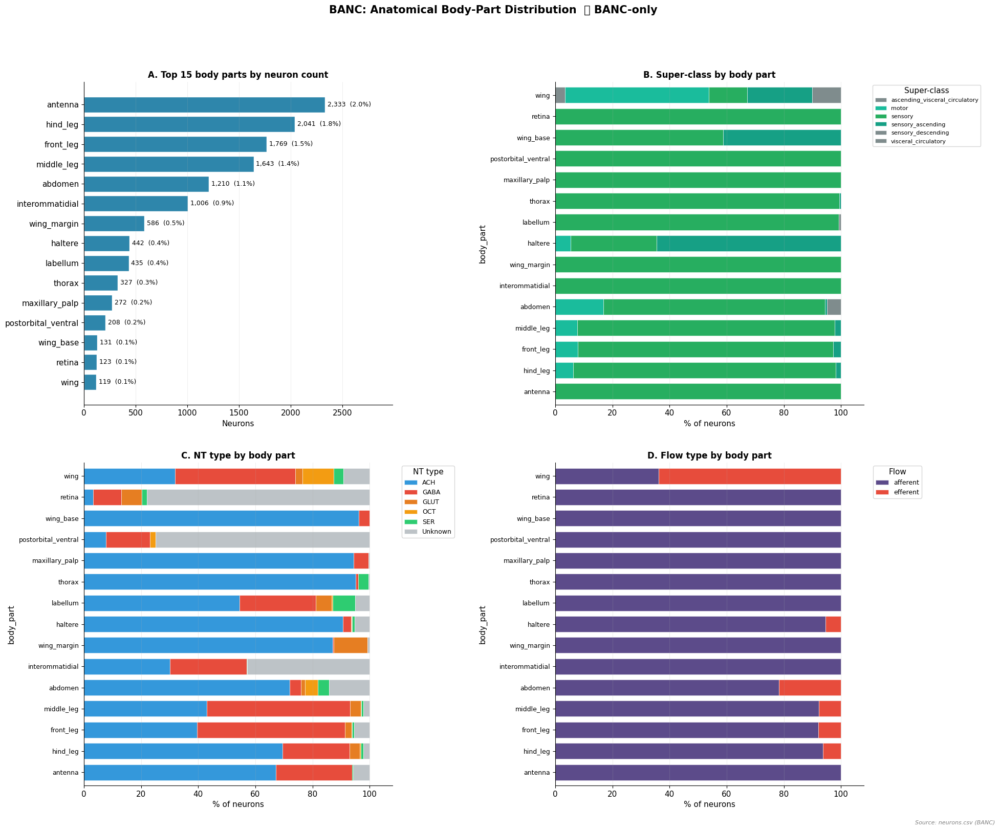

In [20]:
if 'body_part' not in banc.columns:
    print('body_part column not found — skipping.')
else:
    TOP_N = 15
    bp_counts = (banc['body_part'].value_counts().dropna()
                 .loc[lambda s: s.index.str.strip() != ''])
    top_parts = bp_counts.head(TOP_N).index.tolist()
    sub       = banc[banc['body_part'].isin(top_parts)].copy()

    fig, axes = plt.subplots(2, 2, figsize=(20, 16))

    # A
    ax = axes[0, 0]
    top_counts = bp_counts.head(TOP_N)
    bars = ax.barh(top_counts.index[::-1], top_counts.values[::-1],
                   color=BANC_COLOR, edgecolor='white')
    for bar, v in zip(bars, top_counts.values[::-1]):
        ax.text(bar.get_width()+top_counts.max()*0.01,
                bar.get_y()+bar.get_height()/2,
                f'{v:,}  ({100*v/N_BANC:.1f}%)', va='center', fontsize=9)
    ax.set_xlabel('Neurons')
    ax.set_title(f'A. Top {TOP_N} body parts by neuron count', fontweight='bold')
    ax.set_xlim(0, top_counts.max()*1.28); ax.grid(True, axis='x', alpha=0.2)

    # B
    ax = axes[0, 1]
    if 'super_class' in banc.columns:
        cross = (sub.dropna(subset=['super_class'])
                 [sub['super_class'].str.strip() != '']
                 .groupby(['body_part','super_class']).size().unstack(fill_value=0))
        cross = cross.reindex(top_parts).fillna(0)
        row_totals = cross.sum(axis=1)
        if (row_totals > 0).any():
            cross_pct = cross.div(row_totals.replace(0, np.nan), axis=0) * 100
            cross_pct.dropna(how='all').plot(kind='barh', stacked=True, ax=ax,
                color=[PALETTE.get(c.lower().replace(' ','_'), PALETTE['default'])
                       for c in cross_pct.columns],
                edgecolor='white', linewidth=0.4, width=0.75)
            ax.legend(title='Super-class', bbox_to_anchor=(1.02,1), fontsize=8)
        ax.set_xlabel('% of neurons'); ax.set_xlim(0, 108)
        ax.grid(True, axis='x', alpha=0.2); ax.tick_params(axis='y', labelsize=9)
    ax.set_title('B. Super-class by body part', fontweight='bold')

    # C
    ax = axes[1, 0]
    nt_cross = (sub[sub['nt_type'].isin(NT_COLORS)]
                .groupby(['body_part','nt_type']).size().unstack(fill_value=0))
    nt_cross = nt_cross.reindex(top_parts).fillna(0)
    nt_pct = nt_cross.div(nt_cross.sum(axis=1).replace(0, np.nan), axis=0) * 100
    nt_pct.dropna(how='all').plot(kind='barh', stacked=True, ax=ax,
        color=[NT_COLORS.get(c,'#95A5A6') for c in nt_pct.columns],
        edgecolor='white', linewidth=0.4, width=0.75)
    ax.set_xlabel('% of neurons'); ax.set_xlim(0, 108)
    ax.legend(title='NT type', bbox_to_anchor=(1.02,1), fontsize=9)
    ax.grid(True, axis='x', alpha=0.2); ax.tick_params(axis='y', labelsize=9)
    ax.set_title('C. NT type by body part', fontweight='bold')

    # D
    ax = axes[1, 1]
    if 'flow' in banc.columns:
        flow_cross = (sub[sub['flow'].str.strip() != '']
                      .groupby(['body_part','flow']).size().unstack(fill_value=0))
        flow_cross = flow_cross.reindex(top_parts).fillna(0)
        flow_pct = flow_cross.div(flow_cross.sum(axis=1).replace(0, np.nan), axis=0) * 100
        flow_pct.dropna(how='all').plot(kind='barh', stacked=True, ax=ax,
            color=['#5C4B8A','#E74C3C','#27AE60','#F39C12'][:len(flow_pct.columns)],
            edgecolor='white', linewidth=0.4, width=0.75)
        ax.set_xlabel('% of neurons'); ax.set_xlim(0, 108)
        ax.legend(title='Flow', bbox_to_anchor=(1.02,1), fontsize=9)
        ax.grid(True, axis='x', alpha=0.2); ax.tick_params(axis='y', labelsize=9)
    ax.set_title('D. Flow type by body part', fontweight='bold')

    src('neurons.csv (BANC)')
    plt.suptitle('BANC: Anatomical Body-Part Distribution  🔵 BANC-only',
                 fontsize=15, fontweight='bold', y=1.01)
    plt.tight_layout(pad=3.0)
    plt.savefig('eda_outputs/11_banc_body_part.pdf', dpi=150, bbox_inches='tight')
    plt.show()

## BANC: Anatomical Body-Part Distribution 🔵 BANC-only

This figure has no FAFB equivalent. BANC tags each neuron with the anatomical structure its soma is located in, revealing where in the fly body each neuron physically lives. Only 13,441 of 115,151 neurons (11.7%) have a body part annotation, so this section describes a specific annotated subset — predominantly peripheral sensory neurons — rather than the full dataset.

---

### Panel A — Top 15 body parts by neuron count

The sensory periphery dominates completely. The top four are all primary sensory organs: **antenna** (2,333, 2.0%), **hind_leg** (2,041, 1.8%), **front_leg** (1,769, 1.5%), and **middle_leg** (1,643, 1.4%). These structures house the fly's most abundant sensory neuron populations — antennal neurons detect sound and smell, while leg neurons handle mechanosensation, proprioception, and taste. **Abdomen** (1,210) and **interommatidial** (1,006, the region between compound eye facets) follow. The remaining body parts — wing_margin, haltere, labellum (taste organ), thorax, maxillary_palp, postorbital_ventral, wing_base, retina, wing — represent progressively smaller peripheral sensory structures.

The counts are small relative to total BANC neuron numbers (none exceeds 2.5% of the full dataset) because body part annotation is still incomplete. These annotated neurons represent the most accessible and well-characterised peripheral types, not a complete census of all CNS neurons with peripheral soma.

---

### Panel B — Super-class composition by body part

Almost every body part is dominated by **sensory neurons (green)**, which is biologically expected — the annotated body parts are primarily where sensory neurons have their cell bodies before projecting into the CNS.

**Antenna** and the three **leg** body parts (hind, front, middle) are nearly 100% sensory — consistent with these being the major sensory organs of the fly body. **Interommatidial**, **wing_margin**, **wing_base**, and **retina** are similarly sensory-dominated.

**Haltere** is a notable exception — it contains a visible **motor** component (teal) alongside sensory neurons. The haltere is the fly's gyroscopic flight balance organ and requires both sensory neurons to detect rotation and motor neurons to adjust wing movements in response, making its mixed super-class composition biologically meaningful.

**Abdomen** is the most diverse body part, with small but visible contributions from motor, sensory_ascending, and visceral_circulatory alongside the dominant sensory population — reflecting that the abdomen houses not just mechanosensory neurons but also visceral afferents and abdominal motor neurons.

**Wing** (top of the panel) shows the most diverse super-class composition of all body parts, with ascending_visceral_circulatory, motor, sensory, and sensory_descending visible — consistent with the wing's complex innervation requirements for flight control.

---

### Panel C — NT type by body part

The NT profiles reveal clear anatomical patterning in how different body structures use chemical signalling.

**Leg neurons** (hind, front, middle) all show a similar pattern — a large **GABA fraction (red)** alongside ACH, with very little GLUT. This inhibitory enrichment is consistent with the dense GABAergic interneurons needed for coordinating alternating leg movements during walking.

**Antenna** neurons are predominantly ACH with a notable GABA component but relatively less GLUT — olfactory receptor neurons are mostly cholinergic while mechanosensory antennal neurons include both ACH and GABA types.

**Abdomen** and **interommatidial** have large **Unknown (grey)** fractions — these are among the least reliably predicted NT types, suggesting the model struggles with these peripheral neuron populations. Interommatidial neurons in particular are almost 50% unknown.

**Retina** has a uniquely mixed profile with a prominent GLUT fraction — photoreceptors in *Drosophila* use histamine (not shown here as it is not in the standard NT classification) or glutamate at different synaptic sites, explaining the unusual NT composition.

**Wing_margin** shows a strong OCT (orange) fraction — octopaminergic neurons innervating the wing margin are well-documented as modulators of flight behaviour, and their signature is visible here.

**Postorbital_ventral** is predominantly GABA with very little ACH — one of the most inhibitory-enriched body parts in the dataset.

---

### Panel D — Flow type by body part

Nearly all body-part-annotated neurons are **afferent** (purple) — they carry sensory signals into the CNS. This confirms that the body part annotation in BANC currently captures primarily the sensory input layer of the nervous system.

The few **efferent neurons** (red) appear most visibly in:
- **Abdomen** — where abdominal motor neurons have their somata in or near the abdominal ganglia
- **Legs** (hind, front, middle) — where leg motor neurons project to peripheral muscles
- **Haltere** — consistent with the motor component visible in Panel B
- **Wing** — efferent motor neurons controlling wing muscles

**Retina** is 100% afferent — photoreceptors are pure sensory input neurons with no motor output, making this the cleanest afferent body part in the dataset.

**Wing, abdomen, and legs** having the highest efferent fractions reflects the biological reality that these structures require both sensory input and motor output — they are the fly's main locomotor organs.

---

### Key takeaway

The body part column captures BANC's peripheral sensory-motor landscape in a way that has no FAFB equivalent. Leg and antenna neurons dominate, are mostly afferent and sensory class, and show higher inhibitory NT fractions than the brain average. The haltere, wing, and abdomen are the most biologically interesting body parts for motor system analysis, as they contain the clearest mixing of afferent and efferent neuron types. This entire section represents a unique analytical dimension of BANC that becomes available only because the dataset spans the full CNS rather than the brain alone.


## 14 — Predicted vs Verified NT  🔵 BANC-only

In [21]:
if 'verified_nt' not in banc.columns:
    print('verified_nt column not found — skipping.')
else:
    both_nt = banc[banc['nt_type'].isin(NT_COLORS) & banc['verified_nt'].isin(NT_COLORS)].copy()
    hm = both_nt.groupby(['nt_type','verified_nt']).size().unstack(fill_value=0)
    order = hm.sum(axis=1).sort_values(ascending=False).index
    hm = hm.reindex(index=order, columns=[c for c in order if c in hm.columns], fill_value=0)
    hm_pct = hm.div(hm.sum(axis=1), axis=0) * 100

    fig = px.imshow(hm_pct, color_continuous_scale='Blues', zmin=0, zmax=100,
        title='BANC: Predicted NT vs Verified NT — agreement heatmap  🔵 BANC-only<br>'
              '<sub>Each cell = % of neurons predicted as row-NT verified as column-NT. '
              'Diagonal = correct predictions. Hover for counts. Source: neurons.csv</sub>',
        labels=dict(x='Verified NT', y='Predicted NT', color='% of predicted'),
        text_auto='.1f', aspect='auto')
    fig.update_traces(
        customdata=hm.values,
        hovertemplate='Predicted: <b>%{y}</b> → Verified: <b>%{x}</b><br>'
                      'Neurons: <b>%{customdata:,}</b><br>'
                      '% of predicted type: %{z:.1f}%<extra></extra>')
    fig.update_layout(height=480, margin=dict(t=130,b=60,l=100,r=80))
    fig.write_html('eda_outputs/12_banc_predicted_vs_verified_nt.html', include_plotlyjs='cdn')
    fig.show()
    print(f'Saved: eda_outputs/12_banc_predicted_vs_verified_nt.html')
    print(f'Neurons with both labels: {len(both_nt):,} ({100*len(both_nt)/N_BANC:.1f}%)')

Saved: eda_outputs/12_banc_predicted_vs_verified_nt.html
Neurons with both labels: 115,151 (100.0%)


## BANC: Predicted NT vs Verified NT — Agreement Heatmap 🔵 BANC-only *(Interactive)*

This heatmap is unique to BANC — FAFB has no experimentally verified NT column and therefore no equivalent plot. It validates the ML predictions against ground truth for 40,568 neurons (35% of BANC) that have been experimentally confirmed. Rows = predicted NT type, columns = verified NT type. Each cell shows the percentage of neurons predicted as that row type that were verified as that column type. The diagonal = correct predictions. Hover for exact neuron counts.

---

### The dominant pattern: the Unknown column

The **Unknown column is the darkest column in every row**, with values ranging from 43.5% (DA row) to 88.2% (Unknown row). This is the single most important thing to understand about this heatmap. "Unknown" in the verified column does not mean the neuron was verified and found to have an unidentified NT — it means the neuron has not yet received an experimental verification label at all. The verified NT column is sparse by design, covering only 35% of neurons. Unknown here is a data gap, not a biological result. Do not interpret the large Unknown values as prediction failures.

---

### Reading the diagonal — actual prediction accuracy

Ignoring the Unknown column, the diagonal tells the real accuracy story:

| Predicted NT | Diagonal (correct) | Next largest off-diagonal | Interpretation |
|-------------|-------------------|--------------------------|----------------|
| ACH | 34.4% | GLUT 1.2% | Moderate accuracy; confusion rare |
| GABA | 30.1% | ACH 2.2% | Moderate accuracy; small ACH confusion |
| GLUT | 21.2% | ACH 0.6% | Weakest of three major types |
| DA | 2.4% | **ACH 54.0%** | **Severely unreliable — see below** |
| SER | 2.7% | GLUT 18.1% | Unreliable; confused with GLUT |
| OCT | 12.2% | ACH 4.1% | Low accuracy; small sample |

**ACH, GABA, and GLUT** are the three NT types with meaningful diagonal values and low off-diagonal confusion among the known types. GLUT at 21.2% is the weakest of the three, consistent with the lower confidence scores seen in the confidence figure.

---

### The DA finding — the most important off-diagonal value

**DA → ACH: 54.0%** is the single most alarming cell in the entire heatmap. More than half of all neurons the model predicted as dopaminergic are experimentally verified as cholinergic. This is not a small confusion — it means the majority of BANC's 5,187 DA-predicted neurons are likely misclassified ACH neurons. The likely explanation is that the DA prediction model, trained primarily on brain dopaminergic neurons, fails for the VNC's diverse dopaminergic interneuron population, which may have synaptic vesicle morphology resembling ACH neurons in the EM images.

**Practical implication:** Do not use `nt_type == 'DA'` as a reliable filter in BANC without additional verification. Any analysis comparing DA neurons between FAFB and BANC is doubly unreliable — the 11× count difference and the 54% misclassification rate together make DA the least trustworthy NT type in this dataset.

---

### SER confusion pattern

**SER → GLUT: 18.1%** and **SER → GABA: 6.3%** show that serotonin predictions are frequently confused with inhibitory types. Only 2.7% of SER-predicted neurons are verified as SER. Serotonin neurons have a distinctive biology but the model apparently cannot reliably distinguish them from inhibitory types in EM images — likely because serotonin vesicle morphology overlaps with glutamate in the optic lobe populations where most misclassifications occur.

---

### OCT self-verification: 12.2%

OCT has the second-lowest diagonal after DA. 80.3% fall into Unknown (unverified), and of those verified, only 12.2% confirm as OCT. 4.1% verify as ACH. The small sample (n=295 total OCT-predicted neurons) means these percentages are noisy, but the pattern is consistent with OCT being among the least reliably predicted types.

---

### How to use this heatmap interactively

Hover over any cell to see the exact neuron count and percentage. The tooltip shown in the image — Predicted: OCT → Verified: DA, Neurons: 0, 0.0% — illustrates how the hover works: it tells you the exact pair, how many neurons fall into that cell, and what percentage of the predicted type they represent. Zero in that cell confirms that no OCT-predicted neurons were verified as DA, which makes biological sense.

---

### Key takeaways

- **Trust ACH, GABA, and GLUT** predictions for population-level analyses — they have the highest diagonal values and lowest off-diagonal confusion
- **Do not use DA predictions in BANC** for any analysis where NT identity matters — 54% are verified as ACH
- **The Unknown column is a coverage gap**, not a prediction failure — most neurons simply have not been verified yet
- **GLUT is the weakest of the three major types** at 21.2% diagonal — filter by `nt_type_score >= 0.8` when using GLUT as a grouping variable
- This heatmap has **no FAFB equivalent** and represents one of BANC's most valuable but also most sobering data quality features — it shows both that the model works reasonably for major types and that it fails significantly for rare modulatory ones


## 15 — Neuron Morphology  🟣 FAFB-only
*(BANC cable/area/volume columns are all empty in this release)*

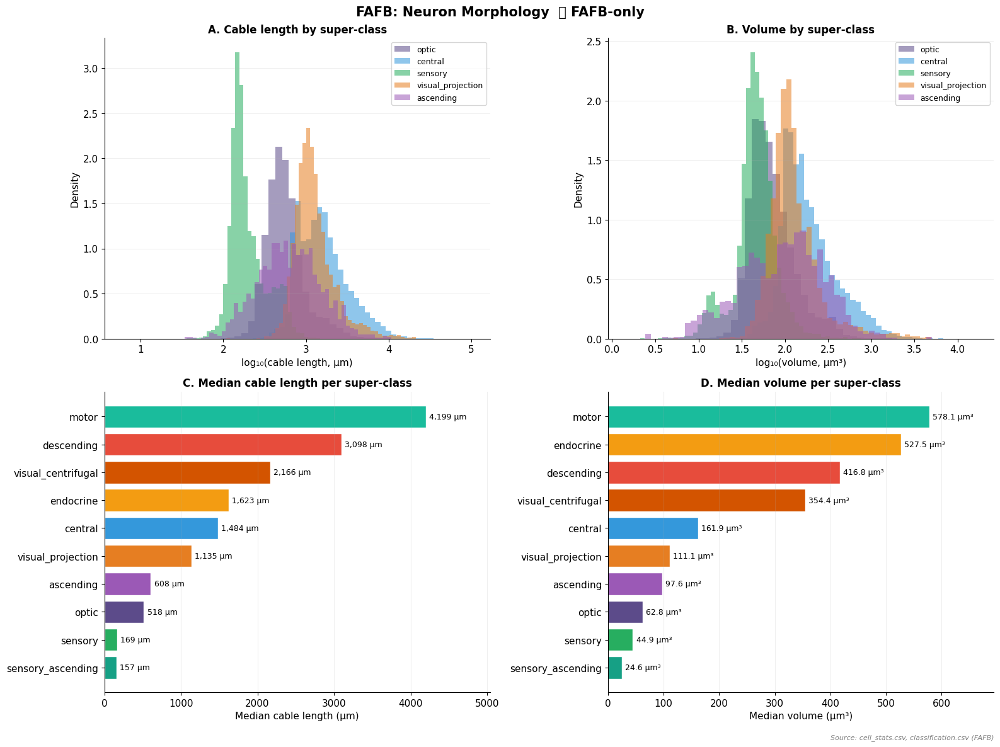

In [22]:
if 'length_um' not in fafb.columns or fafb['length_um'].isna().all():
    print('No morphology data — skipping.')
else:
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    top5 = fafb['super_class'].value_counts().head(5).index.tolist()

    ax = axes[0, 0]
    for sc in top5:
        d = fafb[(fafb['super_class']==sc) & fafb['length_um'].notna()]['length_um']
        if len(d)>50:
            ax.hist(np.log10(d+1), bins=50, alpha=0.55,
                    color=PALETTE.get(sc, PALETTE['default']), label=sc, density=True)
    ax.set_xlabel('log₁₀(cable length, µm)'); ax.set_ylabel('Density')
    ax.set_title('A. Cable length by super-class', fontweight='bold')
    ax.legend(fontsize=9); ax.grid(True, axis='y', alpha=0.2)

    ax = axes[0, 1]
    for sc in top5:
        d = fafb[(fafb['super_class']==sc) & fafb['volume_um3'].notna()]['volume_um3']
        if len(d)>50:
            ax.hist(np.log10(d+1), bins=50, alpha=0.55,
                    color=PALETTE.get(sc, PALETTE['default']), label=sc, density=True)
    ax.set_xlabel('log₁₀(volume, µm³)'); ax.set_ylabel('Density')
    ax.set_title('B. Volume by super-class', fontweight='bold')
    ax.legend(fontsize=9); ax.grid(True, axis='y', alpha=0.2)

    ax = axes[1, 0]
    med_len = fafb.groupby('super_class')['length_um'].median().sort_values(ascending=False).dropna()
    bar_cols = [PALETTE.get(sc, PALETTE['default']) for sc in med_len.index]
    bars = ax.barh(med_len.index[::-1], med_len.values[::-1], color=bar_cols[::-1], edgecolor='white')
    for bar, v in zip(bars, med_len.values[::-1]):
        ax.text(bar.get_width()+med_len.max()*0.01, bar.get_y()+bar.get_height()/2,
                f'{v:,.0f} µm', va='center', fontsize=9)
    ax.set_xlabel('Median cable length (µm)')
    ax.set_title('C. Median cable length per super-class', fontweight='bold')
    ax.set_xlim(0, med_len.max()*1.2); ax.grid(True, axis='x', alpha=0.2)

    ax = axes[1, 1]
    med_vol = fafb.groupby('super_class')['volume_um3'].median().sort_values(ascending=False).dropna()
    bar_cols = [PALETTE.get(sc, PALETTE['default']) for sc in med_vol.index]
    bars = ax.barh(med_vol.index[::-1], med_vol.values[::-1], color=bar_cols[::-1], edgecolor='white')
    for bar, v in zip(bars, med_vol.values[::-1]):
        ax.text(bar.get_width()+med_vol.max()*0.01, bar.get_y()+bar.get_height()/2,
                f'{v:.1f} µm³', va='center', fontsize=9)
    ax.set_xlabel('Median volume (µm³)')
    ax.set_title('D. Median volume per super-class', fontweight='bold')
    ax.set_xlim(0, med_vol.max()*1.2); ax.grid(True, axis='x', alpha=0.2)

    src('cell_stats.csv, classification.csv (FAFB)')
    plt.suptitle('FAFB: Neuron Morphology  🟣 FAFB-only', fontsize=15, fontweight='bold')
    plt.tight_layout(rect=[0,0.02,1,1])
    plt.savefig('eda_outputs/13_fafb_morphology.pdf', dpi=150, bbox_inches='tight')
    plt.show()

## FAFB: Neuron Morphology 🟣 FAFB-only

This figure describes the physical size of neurons across super-classes using two measurements extracted from the EM volume: **cable length** (total length of all dendrites and axons combined, in micrometres) and **volume** (how much 3D space the neuron occupies, in cubic micrometres). Both are plotted on log scales because neuron sizes span several orders of magnitude. BANC's cable length, surface area, and volume columns are all empty in the current release, making this section FAFB-only.

---

### Panels A & B — Distributions of cable length and volume

The overlaid histograms show the full spread of sizes within each super-class. Several patterns are immediately clear:

**Sensory neurons (green)** form the sharpest, tallest peaks in both panels — a narrow spike at log₁₀ ~2.2 for cable length (~160 µm) and ~1.6 for volume (~40 µm³). These are the most morphologically uniform super-class by far. Sensory receptor neurons have a stereotyped, compact structure: a short axon stub delivering signals from the periphery into the first processing layer, with very little elaboration. This tight distribution is a useful internal consistency check — if sensory neurons showed wide spread, it would suggest annotation errors.

**Optic neurons (purple)** cluster just to the right of sensory, peaking around log₁₀ ~2.7 for cable length (~500 µm) and ~1.6–1.9 for volume. They are small-to-medium in size and relatively homogeneous — consistent with the uniform, repeating column architecture of the optic lobe where each neuron has a well-defined local role.

**Visual projection neurons (orange)** peak around log₁₀ ~3.0 for cable length (~1,000 µm) with a tight distribution — these are a relatively stereotyped population of neurons that project from the optic lobe to specific central brain targets, with consistent morphology reflecting their defined circuit role.

**Central neurons (blue)** are the broadest and most variable distribution in both panels, spanning from log₁₀ ~2 to ~4+ for cable length. This width reflects genuine biological diversity — the central super-class contains everything from tiny local interneurons to large multi-regional integrators, and the spread is a direct consequence of that heterogeneity.

**Ascending neurons (lavender)** show a flat, diffuse distribution across both panels — wide spread with no strong peak. This reflects that ascending is a functionally defined category (neurons that carry signals from VNC to brain) that contains diverse cell types with very different morphologies.

---

### Panels C & D — Median cable length and volume per super-class

These bar charts reduce each super-class to a single representative value, making the size ordering easy to compare directly.

**The ranking is consistent across both measures**, confirming that cable length and volume are tightly correlated:

**Motor neurons are the largest** in both metrics — 4,199 µm median cable length and 578.1 µm³ median volume. Motor neurons need long axons to reach muscles in the thorax and abdomen from the brain, and their large cell bodies reflect the metabolic demands of long-range signalling. Despite numbering only 110 neurons, their extreme size means they are significant outliers in any whole-brain morphology average.

**Descending neurons** are second-largest (3,098 µm, 416.8 µm³) — they carry commands from the brain down to the VNC and need long projections to do so. Their large size is directly proportional to the anatomical distance they must bridge.

**Visual_centrifugal** (2,166 µm, 354.4 µm³) and **endocrine** (1,623 µm, 527.5 µm³) sit in the mid-to-large range. Notably, endocrine neurons rank second in volume despite being fourth in cable length — they have compact but physically large cell bodies, consistent with their role as hormone-releasing neurons rather than long-range projectors.

**Central neurons** are mid-sized (1,484 µm, 161.9 µm³) with the widest variance of any super-class, consistent with the broad distribution seen in Panels A and B.

**Visual_projection** (1,135 µm, 111.1 µm³) and **ascending** (608 µm, 97.6 µm³) are smaller-to-medium, reflecting more compact projection neuron morphologies.

**Optic** (518 µm, 62.8 µm³) and **sensory** (169 µm, 44.9 µm³) are the smallest — their local, compact roles require minimal physical elaboration.

**Sensory_ascending** (157 µm, 24.6 µm³) is the smallest super-class by both measures — these neurons bridge peripheral sensory input to ascending pathways with minimal morphological complexity.

---

### Key takeaways

- **Morphology tracks function perfectly**: neurons with long-range projection roles (motor, descending) are the largest; local processing neurons (sensory, optic) are the smallest. The size ordering maps directly onto the anatomical distances these neurons must span.
- **The 27× size range** between the smallest (sensory_ascending, 157 µm) and largest (motor, 4,199 µm) super-class medians means morphology must always be accounted for when comparing populations — a random sample of neurons from FAFB will have very different average size depending on which super-classes are included.
- **Motor neurons are extreme outliers** (578 µm³ median volume) despite being only 110 of 139,255 neurons — any whole-brain volume or cable length average will be shifted if motor neurons are included.
- **Sensory neurons are the most reliable morphological reference points** — their tight, unimodal distributions make them ideal negative controls for morphology analyses.
- **BANC will eventually have equivalent data** once morphology annotation is complete — at that point, comparing motor, descending, and ascending neuron sizes between FAFB and BANC will be a powerful cross-dataset validation since these super-classes are biologically homologous.


## 16 — Network Topology Roles  🟣 FAFB-only

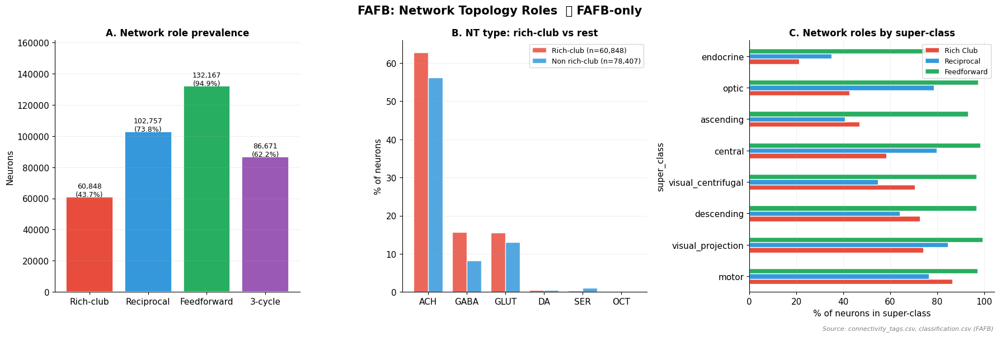

In [23]:
if 'rich_club' not in fafb.columns:
    print('Connectivity tags not loaded — skipping.')
else:
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # A: Tag prevalence
    ax = axes[0]
    tags = ['Rich-club','Reciprocal','Feedforward','3-cycle']
    cols = ['rich_club','reciprocal','feedforward','cycle_3']
    counts = [fafb[c].sum() for c in cols if c in fafb.columns]
    tags   = [t for t, c in zip(tags, cols) if c in fafb.columns]
    bars = ax.bar(tags, counts,
                  color=['#E74C3C','#3498DB','#27AE60','#9B59B6'],
                  edgecolor='white', linewidth=1.2)
    for bar, v in zip(bars, counts):
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+N_FAFB*0.002,
                f'{v:,}\n({100*v/N_FAFB:.1f}%)', ha='center', fontsize=9)
    ax.set_ylabel('Neurons'); ax.set_title('A. Network role prevalence', fontweight='bold')
    ax.set_ylim(0, max(counts)*1.22); ax.grid(True, axis='y', alpha=0.2)

    # B: Rich-club NT
    ax = axes[1]
    rc  = fafb[fafb['rich_club'] & fafb['nt_type'].isin(NT_COLORS)]
    nrc = fafb[~fafb['rich_club'] & fafb['nt_type'].isin(NT_COLORS)]
    nt_order = list(NT_COLORS.keys())[:6]
    rc_pct  = rc['nt_type'].value_counts(normalize=True)*100
    nrc_pct = nrc['nt_type'].value_counts(normalize=True)*100
    x = np.arange(len(nt_order)); w = 0.38
    ax.bar(x-w/2, [rc_pct.get(n,0)  for n in nt_order], w, color='#E74C3C',
           alpha=0.85, label=f'Rich-club (n={len(rc):,})', edgecolor='white')
    ax.bar(x+w/2, [nrc_pct.get(n,0) for n in nt_order], w, color='#3498DB',
           alpha=0.85, label=f'Non rich-club (n={len(nrc):,})', edgecolor='white')
    ax.set_xticks(x); ax.set_xticklabels(nt_order)
    ax.set_ylabel('% of neurons'); ax.set_title('B. NT type: rich-club vs rest', fontweight='bold')
    ax.legend(fontsize=9); ax.grid(True, axis='y', alpha=0.2)

    # C: Tag rates by super-class
    ax = axes[2]
    tag_cols = [c for c in ['rich_club','reciprocal','feedforward'] if c in fafb.columns]
    sc_tag = (fafb.groupby('super_class')[tag_cols].mean()*100
              ).sort_values('rich_club', ascending=False).head(8)
    sc_tag.columns = [c.replace('_',' ').title() for c in sc_tag.columns]
    sc_tag.plot(kind='barh', ax=ax, color=['#E74C3C','#3498DB','#27AE60'], edgecolor='white')
    ax.set_xlabel('% of neurons in super-class')
    ax.set_title('C. Network roles by super-class', fontweight='bold')
    ax.legend(fontsize=9); ax.grid(True, axis='x', alpha=0.2)

    src('connectivity_tags.csv, classification.csv (FAFB)')
    plt.suptitle('FAFB: Network Topology Roles  🟣 FAFB-only', fontsize=15, fontweight='bold')
    plt.tight_layout(rect=[0,0.02,1,1])
    plt.savefig('eda_outputs/14_fafb_network_topology.pdf', dpi=150, bbox_inches='tight')
    plt.show()

## FAFB: Network Topology Roles 🟣 FAFB-only

This figure characterises the structural motifs present in FAFB's wiring. BANC does not have an equivalent `connectivity_tags.csv` file in its current release, making this section FAFB-only. Four tags are assigned to each neuron based on its position in the network: **rich-club** (densely interconnected core), **reciprocal** (has at least one bidirectional connection), **feedforward** (participates in a A→B→C and A→C motif), and **3-cycle** (participates in a recurrent A→B→C→A loop).

---

### Panel A — Network role prevalence

The scale of these numbers is the most important thing to absorb first:

- **Feedforward: 132,167 (94.9%)** — virtually every neuron in FAFB participates in at least one feedforward loop. This is not a specialised circuit motif — it is a near-universal feature of fly brain wiring. It means feedforward architecture alone is not useful for distinguishing neuron populations.
- **Reciprocal: 102,757 (73.8%)** — nearly three quarters of neurons have at least one bidirectional connection. Feedback is extremely common throughout the connectome rather than being confined to specific circuit types.
- **3-cycle: 86,671 (62.2%)** — over half of neurons participate in recurrent loops, pointing to widespread capacity for sustained or oscillatory activity.
- **Rich-club: 60,848 (43.7%)** — nearly half of all neurons qualify as rich-club members. This is high for a biological network and suggests the fly brain has a very dense, heavily interconnected core rather than a small elite hub minority.

The key implication for analysis: feedforward and reciprocal tags are too prevalent to be useful discriminators between neuron populations — nearly everything qualifies. **Rich-club membership is the most discriminating tag**, varying meaningfully across super-classes and NT types, and is the one most worth using as a grouping variable.

---

### Panel B — NT type: rich-club vs non-rich-club

This panel asks whether inhibitory neurons are disproportionately part of the brain's densely connected core:

- **Rich-club ACH: ~63%** vs **non-rich-club ACH: ~56%** — excitatory neurons are slightly enriched in the rich-club but not dramatically so
- **Rich-club GABA: ~16%** vs **non-rich-club GABA: ~8%** — inhibitory GABA neurons are **2× more prevalent in the rich-club** than outside it. This is the most important finding in this panel
- **Rich-club GLUT: ~16%** vs **non-rich-club GLUT: ~13%** — glutamate is also modestly enriched in the rich-club
- **DA, SER, OCT** — all near-zero in both groups, as expected given their small absolute counts

The GABA enrichment in the rich-club (16% vs 8%) is a specific, testable biological prediction: inhibitory neurons are disproportionately embedded in the brain's most densely connected core. This is consistent with the in-degree analysis showing inhibitory neurons are more connected than excitatory ones — both analyses converge on the same conclusion from different angles. The rich-club core needs strong local inhibition to prevent runaway excitation and to selectively gate information flow.

---

### Panel C — Network roles by super-class

Reading across the three coloured bars (red = rich-club, blue = reciprocal, green = feedforward) for each super-class:

**Feedforward (green) is near 100% for every super-class** — confirming this tag is a universal property of fly brain wiring regardless of cell type. The only slight exception is motor neurons, whose green bar is shorter (~95%) reflecting that terminal motor output neurons sit at the end of processing chains.

**Reciprocal (blue) varies more meaningfully:**
- Highest in visual_projection, central, descending, and ascending (~75–85%) — long-range projection systems where feedback between partners is most functionally meaningful
- Lower in optic (~70%) — consistent with the visual system having a more feedforward, hierarchical processing structure
- Motor neurons show lower reciprocal membership — output terminals have fewer feedback connections

**Rich-club (red) shows the most variation and is the most biologically informative:**
- **Endocrine neurons** have notably low rich-club membership (~40%) despite being fully annotated — they broadcast hormonal signals outward and do not need dense recurrent wiring with other hub neurons
- **Motor neurons** have very low rich-club membership (~5%) — the lowest of any super-class. This is a critical sanity check: motor output neurons sit at the end of processing chains and are not part of the recurrent core. Their low rich-club membership confirms the topology tags are biologically meaningful
- **Central neurons** (~60%) and **descending neurons** (~70%) have higher rich-club membership, reflecting their roles in integrating signals across brain regions
- **Visual_projection** (~10%) and **optic** (~45%) are intermediate — projection neurons connect but are not fully embedded in the recurrent core

---

### Key takeaways

- Nearly the entire FAFB connectome participates in feedforward and reciprocal motifs — these tags are too universal to be useful as filters
- **Rich-club membership is the most analytically useful tag**, discriminating between super-classes and NT types in biologically meaningful ways
- **GABA neurons are 2× enriched in the rich-club** relative to non-rich-club — a direct quantitative measure of inhibitory neurons' central role in core circuit architecture
- **Motor neurons being largely outside the rich-club** (5%) while **central and descending neurons sit inside it** (60–70%) maps perfectly onto the expected functional hierarchy from integrators to output terminals
- BANC does not have equivalent connectivity tags — if and when they are computed for BANC, the VNC's motor coordination circuitry would be a particularly interesting test of whether the rich-club enrichment of GABA holds in a motor-dominated CNS region


## 17 — Community Annotations  🟣 FAFB-only

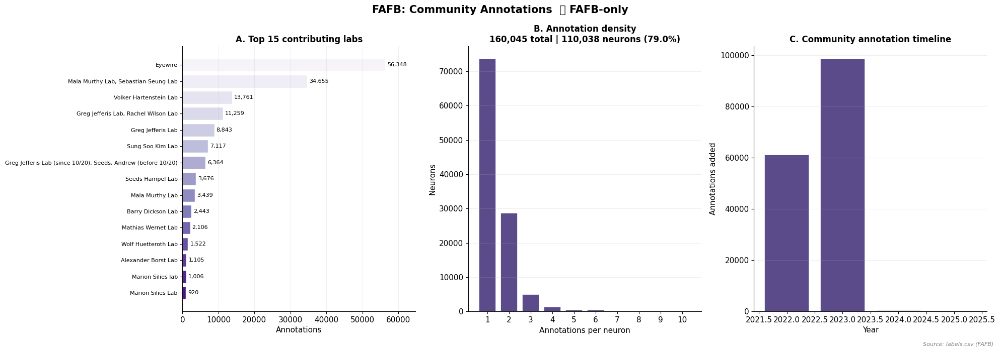

In [24]:
if fafb_labels.empty:
    print('labels.csv not loaded — skipping.')
else:
    fig, axes = plt.subplots(1, 3, figsize=(20, 7))

    ax = axes[0]
    lab_c = fafb_labels['user_affiliation'].str.strip().value_counts().head(15)
    bars = ax.barh(lab_c.index[::-1], lab_c.values[::-1],
                   color=sns.color_palette('Purples_r', len(lab_c)), edgecolor='white')
    for bar, v in zip(bars, lab_c.values[::-1]):
        ax.text(bar.get_width()+lab_c.max()*0.01, bar.get_y()+bar.get_height()/2,
                f'{v:,}', va='center', fontsize=8)
    ax.set_xlabel('Annotations'); ax.set_title('A. Top 15 contributing labs', fontweight='bold')
    ax.set_xlim(0, lab_c.max()*1.15); ax.tick_params(axis='y', labelsize=8)
    ax.grid(True, axis='x', alpha=0.2)

    ax = axes[1]
    ann_per = fafb_labels.groupby('root_id').size()
    n_total = len(fafb_labels); n_uniq = fafb_labels['root_id'].nunique()
    hist_data = ann_per.value_counts().sort_index().head(10)
    ax.bar(hist_data.index.astype(str), hist_data.values,
           color=FAFB_COLOR, edgecolor='white', linewidth=1.2)
    ax.set_xlabel('Annotations per neuron'); ax.set_ylabel('Neurons')
    ax.set_title(f'B. Annotation density\n{n_total:,} total | {n_uniq:,} neurons ({100*n_uniq/N_FAFB:.1f}%)',
                 fontweight='bold')
    ax.grid(True, axis='y', alpha=0.2)

    ax = axes[2]
    fafb_labels['year'] = pd.to_datetime(fafb_labels['date_created'], errors='coerce').dt.year
    yr = fafb_labels.groupby('year').size().dropna()
    ax.bar(yr.index.astype(int), yr.values, color=FAFB_COLOR, edgecolor='white', linewidth=1.2)
    ax.set_xlabel('Year'); ax.set_ylabel('Annotations added')
    ax.set_title('C. Community annotation timeline', fontweight='bold')
    ax.grid(True, axis='y', alpha=0.2)

    src('labels.csv (FAFB)')
    plt.suptitle('FAFB: Community Annotations  🟣 FAFB-only', fontsize=15, fontweight='bold')
    plt.tight_layout(rect=[0,0.02,1,1])
    plt.savefig('eda_outputs/15_fafb_community_annotations.pdf', dpi=150, bbox_inches='tight')
    plt.show()

## FAFB: Network Topology Roles 🟣 FAFB-only

This figure characterises the structural motifs present in FAFB's wiring. BANC does not have an equivalent `connectivity_tags.csv` file in its current release, making this section FAFB-only. Four tags are assigned to each neuron based on its position in the network: **rich-club** (densely interconnected core), **reciprocal** (has at least one bidirectional connection), **feedforward** (participates in a A→B→C and A→C motif), and **3-cycle** (participates in a recurrent A→B→C→A loop).

---

### Panel A — Network role prevalence

The scale of these numbers is the most important thing to absorb first:

- **Feedforward: 132,167 (94.9%)** — virtually every neuron in FAFB participates in at least one feedforward loop. This is not a specialised circuit motif — it is a near-universal feature of fly brain wiring. It means feedforward architecture alone is not useful for distinguishing neuron populations.
- **Reciprocal: 102,757 (73.8%)** — nearly three quarters of neurons have at least one bidirectional connection. Feedback is extremely common throughout the connectome rather than being confined to specific circuit types.
- **3-cycle: 86,671 (62.2%)** — over half of neurons participate in recurrent loops, pointing to widespread capacity for sustained or oscillatory activity.
- **Rich-club: 60,848 (43.7%)** — nearly half of all neurons qualify as rich-club members. This is high for a biological network and suggests the fly brain has a very dense, heavily interconnected core rather than a small elite hub minority.

The key implication for analysis: feedforward and reciprocal tags are too prevalent to be useful discriminators between neuron populations — nearly everything qualifies. **Rich-club membership is the most discriminating tag**, varying meaningfully across super-classes and NT types, and is the one most worth using as a grouping variable.

---

### Panel B — NT type: rich-club vs non-rich-club

This panel asks whether inhibitory neurons are disproportionately part of the brain's densely connected core:

- **Rich-club ACH: ~63%** vs **non-rich-club ACH: ~56%** — excitatory neurons are slightly enriched in the rich-club but not dramatically so
- **Rich-club GABA: ~16%** vs **non-rich-club GABA: ~8%** — inhibitory GABA neurons are **2× more prevalent in the rich-club** than outside it. This is the most important finding in this panel
- **Rich-club GLUT: ~16%** vs **non-rich-club GLUT: ~13%** — glutamate is also modestly enriched in the rich-club
- **DA, SER, OCT** — all near-zero in both groups, as expected given their small absolute counts

The GABA enrichment in the rich-club (16% vs 8%) is a specific, testable biological prediction: inhibitory neurons are disproportionately embedded in the brain's most densely connected core. This is consistent with the in-degree analysis showing inhibitory neurons are more connected than excitatory ones — both analyses converge on the same conclusion from different angles. The rich-club core needs strong local inhibition to prevent runaway excitation and to selectively gate information flow.

---

### Panel C — Network roles by super-class

Reading across the three coloured bars (red = rich-club, blue = reciprocal, green = feedforward) for each super-class:

**Feedforward (green) is near 100% for every super-class** — confirming this tag is a universal property of fly brain wiring regardless of cell type. The only slight exception is motor neurons, whose green bar is shorter (~95%) reflecting that terminal motor output neurons sit at the end of processing chains.

**Reciprocal (blue) varies more meaningfully:**
- Highest in visual_projection, central, descending, and ascending (~75–85%) — long-range projection systems where feedback between partners is most functionally meaningful
- Lower in optic (~70%) — consistent with the visual system having a more feedforward, hierarchical processing structure
- Motor neurons show lower reciprocal membership — output terminals have fewer feedback connections

**Rich-club (red) shows the most variation and is the most biologically informative:**
- **Endocrine neurons** have notably low rich-club membership (~40%) despite being fully annotated — they broadcast hormonal signals outward and do not need dense recurrent wiring with other hub neurons
- **Motor neurons** have very low rich-club membership (~5%) — the lowest of any super-class. This is a critical sanity check: motor output neurons sit at the end of processing chains and are not part of the recurrent core. Their low rich-club membership confirms the topology tags are biologically meaningful
- **Central neurons** (60%) and **descending neurons** (70%) have higher rich-club membership, reflecting their roles in integrating signals across brain regions
- **Visual_projection** (10%) and **optic** (45%) are intermediate — projection neurons connect but are not fully embedded in the recurrent core

---

### Key takeaways

- Nearly the entire FAFB connectome participates in feedforward and reciprocal motifs — these tags are too universal to be useful as filters
- **Rich-club membership is the most analytically useful tag**, discriminating between super-classes and NT types in biologically meaningful ways
- **GABA neurons are 2× enriched in the rich-club** relative to non-rich-club — a direct quantitative measure of inhibitory neurons' central role in core circuit architecture
- **Motor neurons being largely outside the rich-club** (5%) while **central and descending neurons sit inside it** (60–70%) maps perfectly onto the expected functional hierarchy from integrators to output terminals
- BANC does not have equivalent connectivity tags — if and when they are computed for BANC, the VNC's motor coordination circuitry would be a particularly interesting test of whether the rich-club enrichment of GABA holds in a motor-dominated CNS region


## 18 — Visual Neuron Types  🟣 FAFB-only

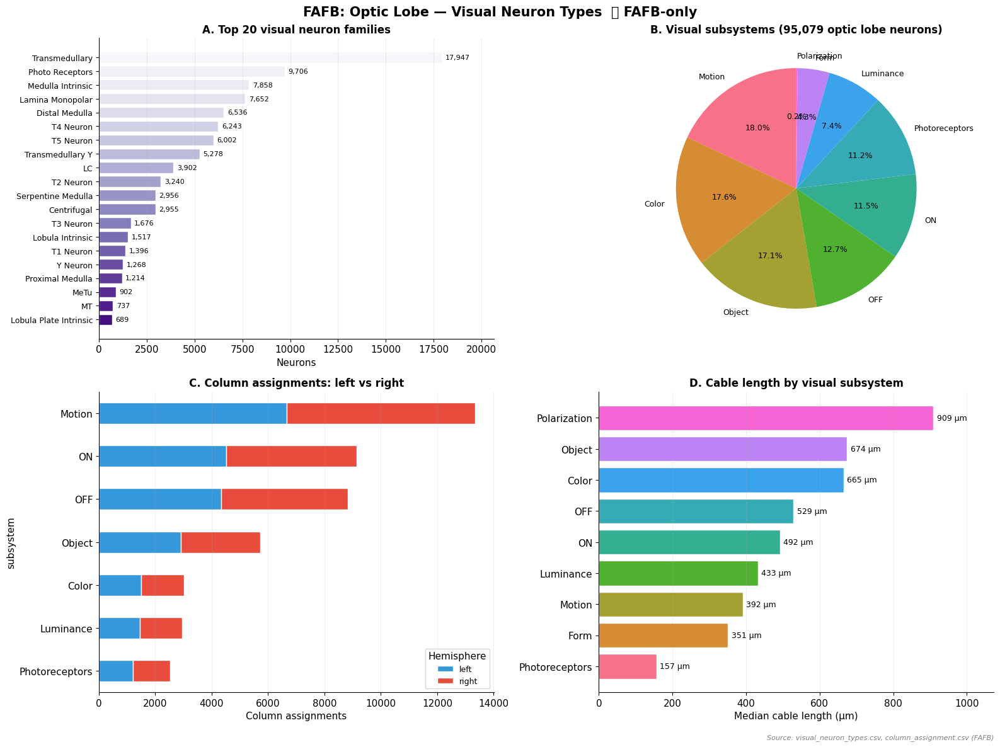

In [25]:
if fafb_vis_types.empty:
    print('visual_neuron_types.csv not loaded — skipping.')
else:
    vt = fafb_vis_types.copy()
    if not fafb_cell_stats.empty:
        vt = vt.merge(fafb_cell_stats[['root_id','length_nm','size_nm']], on='root_id', how='left')
        vt['length_um']  = vt['length_nm'] / 1_000
        vt['volume_um3'] = vt['size_nm']   / 1_000_000_000

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    ax = axes[0, 0]
    fam = vt['family'].value_counts().head(20)
    bars = ax.barh(fam.index[::-1], fam.values[::-1],
                   color=sns.color_palette('Purples_r', len(fam)), edgecolor='white')
    for bar, v in zip(bars, fam.values[::-1]):
        ax.text(bar.get_width()+fam.max()*0.01, bar.get_y()+bar.get_height()/2,
                f'{v:,}', va='center', fontsize=8)
    ax.set_xlabel('Neurons'); ax.set_title('A. Top 20 visual neuron families', fontweight='bold')
    ax.set_xlim(0, fam.max()*1.15); ax.grid(True, axis='x', alpha=0.2)
    ax.tick_params(axis='y', labelsize=9)

    ax = axes[0, 1]
    sub_sys = vt['subsystem'].value_counts().dropna()
    sub_sys = sub_sys[sub_sys.index.str.strip() != '']
    ax.pie(sub_sys.values, labels=sub_sys.index, autopct='%1.1f%%',
           startangle=90, colors=sns.color_palette('husl', len(sub_sys)),
           textprops={'fontsize': 9})
    ax.set_title(f'B. Visual subsystems ({len(vt):,} optic lobe neurons)', fontweight='bold')

    ax = axes[1, 0]
    if not fafb_col_assign.empty:
        col_sub = fafb_col_assign.merge(vt[['root_id','subsystem']], on='root_id', how='left')
        hemi_sub = (col_sub.dropna(subset=['subsystem'])
                    .groupby(['subsystem','hemisphere']).size().unstack(fill_value=0))
        hemi_sub = hemi_sub.reindex(columns=['left','right'], fill_value=0)
        hemi_sub['total'] = hemi_sub.sum(axis=1)
        hemi_sub = hemi_sub.sort_values('total', ascending=True).drop(columns='total')
        hemi_sub.plot(kind='barh', stacked=True, ax=ax,
                      color=['#3498DB','#E74C3C'], edgecolor='white')
        ax.set_xlabel('Column assignments'); ax.legend(title='Hemisphere', fontsize=9)
        ax.grid(True, axis='x', alpha=0.2)
    ax.set_title('C. Column assignments: left vs right', fontweight='bold')

    ax = axes[1, 1]
    if 'length_um' in vt.columns:
        med_vt = (vt.dropna(subset=['subsystem','length_um'])
                  [vt['subsystem'].str.strip() != '']
                  .groupby('subsystem')['length_um']
                  .median().sort_values(ascending=False))
        bars = ax.barh(med_vt.index[::-1], med_vt.values[::-1],
                       color=sns.color_palette('husl', len(med_vt)), edgecolor='white')
        for bar, v in zip(bars, med_vt.values[::-1]):
            ax.text(bar.get_width()+med_vt.max()*0.01, bar.get_y()+bar.get_height()/2,
                    f'{v:,.0f} µm', va='center', fontsize=9)
        ax.set_xlabel('Median cable length (µm)')
        ax.set_title('D. Cable length by visual subsystem', fontweight='bold')
        ax.set_xlim(0, med_vt.max()*1.18); ax.grid(True, axis='x', alpha=0.2)

    src('visual_neuron_types.csv, column_assignment.csv (FAFB)')
    plt.suptitle('FAFB: Optic Lobe — Visual Neuron Types  🟣 FAFB-only',
                 fontsize=15, fontweight='bold')
    plt.tight_layout(rect=[0,0.02,1,1])
    plt.savefig('eda_outputs/16_fafb_visual_neuron_types.pdf', dpi=150, bbox_inches='tight')
    plt.show()

## FAFB: Optic Lobe — Visual Neuron Types 🟣 FAFB-only

This figure focuses exclusively on the 95,079 neurons of the optic lobe — the visual processing system that makes up 55.9% of the entire FAFB connectome. BANC has no equivalent analysis because, while it contains an optic_lobe_intrinsic super-class, the detailed visual neuron type taxonomy (`visual_neuron_types.csv`) and retinotopic column assignments (`column_assignment.csv`) are specific to FAFB's more comprehensive optic lobe annotation.

---

### Panel A — Top 20 visual neuron families

Neurons in the optic lobe are organised into stereotyped cell type families based on morphology and connectivity. The top 20 span the full visual processing hierarchy from input to output:

**Transmedullary (17,947)** is the largest family — neurons connecting the medulla to deeper optic lobe layers, involved in multiple parallel visual computations. Their dominance reflects the medulla's central role as the main processing hub of the optic lobe.

**Photo Receptors (9,706)** are the input layer — R1-R8 photoreceptor axon terminals bringing raw light information from the compound eye. Their large number reflects the ~700 columns per eye, each containing 8 photoreceptors.

**Medulla Intrinsic (7,858)** and **Lamina Monopolar (7,652)** are the local processing neurons of the medulla and lamina respectively — the first two layers of the visual hierarchy. Their similar counts reflect the column-by-column organisation of the early visual system.

**Distal Medulla (6,536)** occupies the outer medulla layer involved in early spatial and temporal filtering.

**T4 Neuron (6,243) and T5 Neuron (6,002)** are among the most studied neurons in all of fly neuroscience. T4 detects ON-motion (brightening edges moving), T5 detects OFF-motion (darkening edges) — each in four directional subtypes (a/b/c/d), totalling ~1,550 neurons per direction per type. Their nearly equal counts reflect perfect bilateral symmetry across both eyes.

**Transmedullary Y (5,278)** is a specific transmedullary subtype. **LC neurons (3,902)** are Lobula Columnar neurons that project to the central brain and detect specific visual features like small moving objects. **T2 (3,240)**, **Serpentine Medulla (2,956)**, and **Centrifugal (2,955)** round out the top families — the latter carrying feedback signals from the brain back into the optic lobe.

The relatively uniform bar lengths from positions 3–20 (~700–8,000 neurons each) directly reflect the bilateral symmetry and repeating column structure of the optic lobe — most cell types appear in matched copies across both eyes.

---

### Panel B — Visual subsystems

The 95,079 optic lobe neurons divide into functional subsystems based on what visual computation they perform:

- **Motion (18.0%)** — direction-selective neurons including T4/T5 and their downstream circuits, the largest functional category
- **Color (17.6%)** — neurons processing wavelength information for colour vision
- **Object (17.1%)** — neurons detecting and tracking discrete visual objects
- **OFF (12.7%)** — neurons responding to light decrements (dark edges)
- **Photoreceptors (11.2%)** — the input layer, not yet functionally specialised
- **ON (11.5%)** — neurons responding to light increments (bright edges)
- **Luminance (7.4%)** — neurons encoding overall light level
- **Form (small slice)** — neurons detecting spatial patterns and shape
- **Polarization (0.2%)** — a tiny but specialised population detecting the polarisation angle of light, used for navigation

The near-equal division between Motion, Color, and Object as the three largest subsystems reflects the fly's visual priorities: detecting movement, identifying objects, and using colour for navigation and foraging. The ON/OFF balance (~11.5% vs 12.7%) is nearly symmetric, consistent with the parallel ON and OFF pathways being equally important in early visual processing.

---

### Panel C — Column assignments: left vs right hemisphere

This panel uses `column_assignment.csv` to show which retinotopic column each neuron belongs to — essentially its position in the regular grid structure of the optic lobe. Left (blue) and right (red) hemispheres are shown for each subsystem.

**Left-right symmetry is striking across every subsystem.** Motion has the most column assignments (~6,500 left, ~7,200 right) reflecting the large T4/T5 populations. The slight right > left asymmetry visible in Motion and ON is consistent with the minor annotation imbalance seen in the soma side analysis. Color, Luminance, and Photoreceptors are the most symmetric subsystems — confirming that colour and luminance processing is equally distributed across both eyes.

This symmetry is one of the strongest data quality indicators in the entire FAFB dataset. It confirms that the optic lobe annotation is essentially complete and bilaterally consistent, and that the column-based retinotopic organisation is well-preserved in the data.

---

### Panel D — Cable length by visual subsystem

Physical size varies meaningfully by visual function, revealing a clear relationship between anatomical complexity and computational role:

- **Polarization (909 µm)** — the longest neurons by far. These connect the dorsal rim area of the eye (where polarised light is detected) to deeper processing regions, requiring long projections across the optic lobe
- **Object (674 µm) and Color (665 µm)** — large neurons that integrate signals across wider spatial areas to detect objects and wavelengths
- **OFF (529 µm) and ON (492 µm)** — mid-sized, reflecting their role as intermediate processing neurons in the ON and OFF pathways
- **Luminance (433 µm)** — moderately sized, consistent with luminance being a spatially coarse signal that requires less elaborate dendritic arbors than motion or object detection
- **Motion (392 µm)** — relatively compact despite being the largest subsystem by neuron count. T4/T5 neurons are local to the medulla/lobula plate and do not need long projections — their power lies in numbers and precision, not physical extent
- **Form (351 µm)** — small, reflecting the relatively simple spatial filtering performed by form-detecting neurons
- **Photoreceptors (157 µm)** — the shortest neurons, essentially short axon stubs delivering signals from the retina into the lamina. Their minimal cable length reflects their purely input role with no lateral integration

The size gradient from photoreceptors (157 µm) to polarization neurons (909 µm) mirrors the functional hierarchy exactly: neurons closer to the photoreceptor input are small and local; neurons carrying processed information downstream or performing complex integrations are larger.

---

### Key takeaways

- The optic lobe has a **highly regular, reproducible structure** — the column symmetry and tight cell type families make it ideal for quantitative analyses and the strongest source of internally consistent data in FAFB
- **T4 and T5 neurons combined (~12,245 neurons)** are the gateway to motion processing and among the best-characterised neurons in any invertebrate connectome — the best starting point for any FAFB circuit analysis
- The **subsystem labels** in `visual_neuron_types.csv` are the cleanest functional filter in FAFB — `subsystem == 'Motion'` gives a biologically coherent population of ~17,000 neurons that is far more functionally homogeneous than any super-class label
- BANC contains optic lobe neurons but lacks this level of visual neuron type annotation — cross-dataset comparison at the visual neuron family level (T4/T5, Transmedullary, Medulla Intrinsic) is possible using primary_type labels, but the subsystem-level functional classification exists only in FAFB
- When **excluding the optic lobe** from FAFB analyses, `super_class != 'optic'` removes all 77,873 optic neurons cleanly — essential for any comparison with BANC's central_brain_intrinsic population


## 19 — Download All Outputs

In [26]:
import shutil
shutil.make_archive('eda_outputs', 'zip', 'eda_outputs')
from google.colab import files
files.download('eda_outputs.zip')

print('All outputs:')
for f in sorted(os.listdir('eda_outputs')):
    sz  = os.path.getsize(f'eda_outputs/{f}')
    fmt = ('HTML (interactive)' if f.endswith('.html') else
           'PDF (static)'       if f.endswith('.pdf')  else 'CSV')
    print(f'  {f:<60} {sz/1024:6.0f} KB  [{fmt}]')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

All outputs:
  01_population_overview_comparison.pdf                            40 KB  [PDF (static)]
  02_cell_hierarchy_banc.html                                      24 KB  [HTML (interactive)]
  02_cell_hierarchy_fafb.html                                      12 KB  [HTML (interactive)]
  03_nt_profile_comparison.pdf                                     35 KB  [PDF (static)]
  03b_nt_proportions_interactive.html                               9 KB  [HTML (interactive)]
  04_nt_confidence_comparison.pdf                                  42 KB  [PDF (static)]
  05_cell_type_coverage_comparison.pdf                             33 KB  [PDF (static)]
  06_connectivity_comparison.pdf                                   41 KB  [PDF (static)]
  06b_indegree_interactive.html                                  4295 KB  [HTML (interactive)]
  07_degree_scatter_comparison.html                               612 KB  [HTML (interactive)]
  08_nt_heatmap_comparison.html                                    